Bilayer unit domain. Sigma optimisation

In [41]:
# Importing libraries
import matplotlib.pyplot as plt
from matplotlib import ticker
import numpy as np
from mpi4py import MPI
from ufl import (
    inner,
    grad,
    conj,
    TrialFunction,
    TestFunction,
    as_matrix,
    as_vector,
    dot,
    Or,
    Measure,
    conditional,
    SpatialCoordinate,
    dx,
)
from dolfinx.mesh import locate_entities_boundary, create_interval, locate_entities, meshtags
from dolfinx.fem import FunctionSpace, Function, functionspace, Function, dirichletbc, locate_dofs_topological, petsc, form, assemble_matrix, assemble_scalar
import basix
from petsc4py.PETSc import ScalarType
from slepc4py.SLEPc import EPS  

Domain, PML, refinement and physical configurations

In [42]:
# Define element size for the mesh refinement
h_i = [0.125/4,   # N=2
       0.125/8,   # N=3
       0.125/16,] # N=4

# Domain configuration
Lx = 1. # fluid domain length (without PML)
l_inner=Lx/2

# Physical configuration
rho_media_1 = 1. # kg/m^3 
vel_media_1 = 2.   # m/s
rho_media_2 = 1. # kg/m^3 
vel_media_2 = 1.   # m/s


# Define the density and velocity functions  
def rho_function(x):    
    return np.where(x[0] > l_inner, rho_media_2,rho_media_1)

def vel_function(x):    
    return np.where(x[0] > l_inner, vel_media_2,vel_media_1)

# PML configuration
pml_thickness = Lx/4

# Solver configuration
requested_eigenvalues_number = 90 # Number of eigenvalues to compute


degree=[2,1]  # Polynomial degree for pressure and velocity
sigma_sweep_piecewise=np.linspace(0.5, 10., 40)
target=-12.5j


Solver configuration and computing

In [43]:
def get_configured_problem(mesh, degrees, sigma_x):
    # Initialize dictionaries
    dof = {}
    solver_dict={}
    V_dict={}
    Q_dict={}

    # Define finite element spaces
    p_fe_type = basix.ufl.element(family="Lagrange", cell=mesh.basix_cell(), degree=degrees[0])
    v_fe_type = basix.ufl.element(family="DG", cell=mesh.basix_cell(), degree=degrees[1], shape=(mesh.geometry.dim,))
    FE = {"p": p_fe_type, "v": v_fe_type}

    # Create a submesh of PML associated cells
    tdim = mesh.topology.dim

    # Identify the fluid cells
    # fluid_cells = locate_entities(mesh, tdim, lambda x: x[0] <= Lx)

    # Create function spaces for mesh and submesh
    Q = functionspace(mesh,FE["p"])
    V = functionspace(mesh, FE["v"])

    # Dictionaries to store the number of dofs
    dof["p"] = Q.dofmap.index_map.size_global
    dof["v"] = V.dofmap.index_map.size_global

    # Boundary conditions application (for pressure)
    bc = []
    facets = locate_entities_boundary(mesh, 0, lambda x: np.isclose(x[0], 0.0))
    o_boundary_dofs = locate_dofs_topological(Q, 0, facets)  # the dimension is related to mesh entity where dofs are located

    # Setting to zero located dofs related to boundaries
    u_d = Function(Q)
    u_d.x.array[:] = 0.0  # Asign Dirichlet condition value
    bc.append(dirichletbc(u_d, o_boundary_dofs)) 
    
    facets = locate_entities_boundary(mesh, 0, lambda x: np.isclose(x[0], Lx+pml_thickness))
    o_boundary_dofs = locate_dofs_topological(Q, 0, facets)  # the dimension is related to mesh entity where dofs are located

    # Setting to zero located dofs related to boundaries
    u_d = Function(Q)
    u_d.x.array[:] = 0.0  # Asign Dirichlet condition value
    bc.append(dirichletbc(u_d, o_boundary_dofs)) 

    # Define differential operators
    dx = Measure("dx", domain=mesh)

    # Interpolates the density and velocity functions
    W = functionspace(mesh, ("DG", 2))
    rho = Function(W)
    rho.interpolate(rho_function)
    c = Function(W)
    c.interpolate(vel_function)

    # Spatial Coordinate is updated for the actual mesh
    x = SpatialCoordinate(mesh)

    # Variation formulation definition
    p = TrialFunction(Q) 
    v = TrialFunction(V)
    q = TestFunction(Q)
    w = TestFunction(V)

    # Define the variational forms
    a = form(
        [
            [sigma_x(x) / (rho * c**2) * p * conj(q) * dx, -1 * inner(v, grad(q)) * dx],
            [inner(grad(p), w) * dx, sigma_x(x) * rho * inner(v, w) * dx],
        ]
    )
    b = form(
        [
            [1.0 / (rho * c**2) * p * conj(q) * dx, None],
            [None, rho * inner(v, w) * dx],
        ]  
    )
    # Assemble matrices
    A = petsc.assemble_matrix_block(a, bcs=bc)
    A.assemble()
    B = petsc.assemble_matrix_block(b, bcs=bc)
    B.assemble()

    # SLEPc solver configuration for linear eigenvalue problem (A x =\lambda x B)
    solver = EPS().create()
    solver.setOperators(-A, B)
    solver.setType("arnoldi")
    solver.setWhichEigenpairs(9)  # TARGET_IMAGINARY = 9, TARGET_MAGNITUDE = 7, TARGET_REAL = 8
    solver.setDimensions(
        requested_eigenvalues_number,
        4 * requested_eigenvalues_number,
        4 * requested_eigenvalues_number,
    )
    solver.setTolerances(1e-16, 100)
    st = solver.getST()
    st.setType("sinvert")  # Applying spectral transformation "shift and invert" 
    solver.setTarget(target)  
    solver.solve()
    n_eigs_converged_piecewise = solver.getConverged()

    return solver, mesh, Q, V, dof

In [44]:
def assign_eigenvector_to_functions(vrA, p_h, v_h, dof, normalize_at):
    """
    Reparte o vector eigenvector 'vrA' entre p_h e v_h
    e normaliza no punto 'normalize_at'.
    """

    # --- separar as partes do autovector ---
    p_vals = vrA[:dof["p"]]
    v_vals = vrA[dof["p"]:]

    # asignar
    p_h.x.array[:] = p_vals
    v_h.x.array[:] = v_vals

    # --- normalización opcional ---
    if normalize_at is not None:
        p_norm = p_h.eval(normalize_at, 1)
        v_norm = v_h.eval(normalize_at, 1)
        if abs(p_norm) == 0:
            raise RuntimeError("Non se pode normalizar: valor 0 no punto dado de p.")
        if abs(v_norm) == 0:
            raise RuntimeError("Non se pode normalizar: valor 0 no punto dado de v.")

        p_h.x.array[:] /= p_norm
        v_h.x.array[:] /= v_norm
    return p_h, v_h

In [45]:
def get_exact_eigenpair(solver, selected_index, Q, V, x_hat, sigma_x, gamma_x, normalize_at):
    exact_physical_eigs_function= lambda n: vel_media_1 / l_inner * np.arctan(-1j * (vel_media_2 * rho_media_2) / (vel_media_1 * rho_media_1))+ n * np.pi * vel_media_1 / l_inner
    w=exact_physical_eigs_function(selected_index)

    p_1 = lambda x: np.sin(w * x[0] / vel_media_1)
    p_2 = lambda x: -np.sin(-w * l_inner / vel_media_1) * np.exp(1j * w / vel_media_2 * (x_hat(x,w) - l_inner))
    p = lambda x: np.where(x[0] > l_inner, p_2(x), p_1(x))

    sigma_x_function_cond= lambda x: np.where(x[0]<Lx, x[0]*0., sigma_x(x))

    v_1=lambda x: 1/(-1j*w)*(w / vel_media_1) * np.cos(w * x[0] / vel_media_1)
    v_2 = (lambda x: 1/(-1j*w+sigma_x_function_cond(x)*rho_media_1)* -np.sin(-w * l_inner / vel_media_1) *(1j * w / vel_media_2)
        * np.exp(1j * w / vel_media_2 * (x_hat(x,w) - l_inner))* gamma_x(x, w)[0])
    v = lambda x: np.where(x[0] > l_inner, v_2(x), v_1(x))

    p_ex = Function(Q, name="p_ex")
    p_ex.interpolate(p)

    v_ex = Function(V, name="v_ex")
    v_ex.interpolate(v)

    # --- normalización opcional ---
    if normalize_at is not None:
        p_norm = p_ex.eval(normalize_at, 1)
        v_norm = v_ex.eval(normalize_at, 1)
        if abs(p_norm) == 0:
            raise RuntimeError("Non se pode normalizar: valor 0 no punto dado de p.")
        if abs(v_norm) == 0:
            raise RuntimeError("Non se pode normalizar: valor 0 no punto dado de v.")
        p_ex.x.petsc_vec.array[:] /= p_norm
        v_ex.x.petsc_vec.array[:] /= v_norm

    return [w, p_ex, v_ex]

In [46]:
def get_function_plot_data(u):
    """
    Devolve (x_sorted, values_sorted) listos para plt.plot.

    Funciona en mallas 1D en dolfinx 0.9.
    Usa coordenadas dos DOFs do espazo de u.
    """

    V = u.function_space
    mesh = V.mesh

    # Coordenadas dos DOFs
    X = V.tabulate_dof_coordinates().copy()

    # COLAPSAR dimensións sobrantes: quedamos coa coordenada x
    if X.shape[1] > 1:
        X = X[:, 0]

    # Obter valores da función
    try:
        vals = u.x.array.copy()
    except AttributeError:
        vals = u.vector.getArray().copy()

    # Ordenar por coordenada x
    idx = np.argsort(X)
    return X[idx], vals[idx]


In [47]:
def project_exact_to_mesh(u_exact, Vh):
    """
    Proxecta/interpola unha expresión exacta (UFL) ou un Function
    doutra malla ao espazo funcional Vh (malla actual).

    Funciona en dolfinx 0.9 e evita todos os problemas de dimensión
    e de Expression nos MixedElements.
    """

    # Se u_exact xa é un Function no mesmo espazo, devolver directamente
    if isinstance(u_exact, Function) and u_exact.function_space == Vh:
        return u_exact

    # Crear Function sobre Vh
    u_proj = Function(Vh)

    # Caso 1: exacta é Function doutra malla -> interpolar
    if isinstance(u_exact, Function):
        u_proj.interpolate(u_exact)
        return u_proj

    # Caso 2: exacta é UFL Expression -> interpolar mediante Expression
    # Obter puntos de interpolación (DOF coordinates)
    X = Vh.tabulate_dof_coordinates()

    # Se é 1D pero X ven con máis dimensións, quedar coa primeira columna
    if X.ndim == 2 and X.shape[1] > 1:
        X = X[:, :1]

    expr = Expression(u_exact, X, dtype=u_proj.x.array.dtype)
    u_proj.interpolate(expr)

    return u_proj


In [48]:
def eigenvector_L2_error_physical(u_num, u_exact, Lx, mesh):
    """
    Erro relativo L2 só no dominio físico [0, Lx] en DOLFINx 0.9.
    Alinea fase/signo antes de medir o erro.
    """

    import numpy as np
    import ufl
    from ufl import inner
    from dolfinx.mesh import locate_entities, meshtags
    from dolfinx.fem import form, assemble_scalar

    tdim = mesh.topology.dim

    # --- 1) Localizar celas físicas ---
    cells_phys = locate_entities(
        mesh, tdim,
        lambda x: np.logical_and(x[0] >= 0, x[0] < Lx)
    )

    if len(cells_phys) == 0:
        raise RuntimeError("Non se detectaron celas na rexión física [0, Lx].")

    # Asignar etiqueta 1
    values = np.full(len(cells_phys), 1, dtype=np.int32)
    mt = meshtags(mesh, tdim, cells_phys, values)

    # Medida restrinxida
    dx_phys = ufl.Measure("dx", domain=mesh, subdomain_data=mt)

    # --- 2) Alinear fase só na zona física ---
    inner_num_exact = assemble_scalar(form(inner(u_num, u_exact) * dx_phys(1)))
    inner_exact_exact = assemble_scalar(form(inner(u_exact, u_exact) * dx_phys(1)))

    c = inner_num_exact / inner_exact_exact

    u_aligned = u_num.copy()
    u_aligned.x.array[:] = u_num.x.array[:] / c

    # --- 3) Norma L2 do erro no dominio físico ---
    diff = u_aligned - u_exact

    num = np.sqrt(assemble_scalar(form(inner(diff, diff) * dx_phys(1))))
    den = np.sqrt(assemble_scalar(form(inner(u_exact, u_exact) * dx_phys(1))))

    return num / den


In [49]:
def get_closest_approx_eigenpair(solver, Q, V, dof, sigma_i, mesh, verbose=False, plot=False):
    """
    Devuelve el autovalor y autovector más cercano a omega_target
    usando distancia compleja |λ - λ_target|, sin usar get_approx_eigenpair.

    Returns
    -------
    lambda_best : complex
    x_best : PETSc.Vec (copia del autovector)
    idx_best : int (índice raw en solver)
    p_h:    Function
    v_h: Function
    """
    exact_eigenvalues = [None] * 5 # Almacena los autovalores exactos
    p_exact = [None] * 5  # Almacena los autovectores exactos de presión
    v_exact = [None] * 5  # Almacena los autovectores exactos de velocidad
    p_approx = [None] * 5  # Almacena los autovectores exactos de presión
    v_approx = [None] * 5  # Almacena los autovectores exactos de velocidad
    best_0 = None
    best_3 = None

    # Vector temporal para extraer Eigenpairs
    p_h = Function(Q, name="p_h")
    v_h = Function(V, name="v_h")

    # Número de modos convergidos
    nconv = solver.getConverged()
    if nconv == 0:
        raise RuntimeError("No hay autovalores convergidos")

    # Vector temporal para extraer Eigenpairs
    vrA, vi = solver.getOperators()[0].getVecs()

    sigma_piecewise_py=lambda x: (np.abs(x[0]) >= Lx) * sigma_i 
    gamma_x_piecewise = lambda x, w: 1 + (np.abs(x[0]) >= Lx) * (1j / w) * sigma_i + x[0]*0.0
    x_hat_piecewise = lambda x, w: np.where(x[0] >= Lx, x[0] + (1j / w) * sigma_i * (x[0] - Lx), x[0])

    [exact_eigenvalues[0], p_exact[0], v_exact[0]] =   get_exact_eigenpair(solver, 1, Q, V, x_hat_piecewise, sigma_piecewise_py, gamma_x_piecewise, [Lx, 0, 0])
    [exact_eigenvalues[3], p_exact[3], v_exact[3]] =   get_exact_eigenpair(solver, 4, Q, V, x_hat_piecewise, sigma_piecewise_py, gamma_x_piecewise, [Lx, 0, 0])

    for k in range(nconv):
        approx_eigenvalue = solver.getEigenvalue(k) * 1j 
        solver.getEigenpair(k, vrA)  
        # Vector temporal para extraer Eigenpairs
        p_h = Function(Q, name="p_h")
        v_h = Function(V, name="v_h")
        [p_h, v_h]=assign_eigenvector_to_functions(vrA = vrA, p_h = p_h, v_h = v_h, dof = dof, normalize_at = [Lx, 0, 0])

        # --- autovalores ---
        err_eig_0 = abs(approx_eigenvalue - exact_eigenvalues[0]) / abs(exact_eigenvalues[0])
        err_eig_3 = abs(approx_eigenvalue - exact_eigenvalues[3]) / abs(exact_eigenvalues[3])

        # --- autovectores ---
        err_p_0 = eigenvector_L2_error_physical(p_h, p_exact[0], Lx, mesh)
        err_v_0 = eigenvector_L2_error_physical(v_h, v_exact[0], Lx, mesh)

        err_p_3 = eigenvector_L2_error_physical(p_h, p_exact[3], Lx, mesh)
        err_v_3 = eigenvector_L2_error_physical(v_h, v_exact[3], Lx, mesh)

        # Total
        err_0 = err_eig_0 + err_p_0 + err_v_0
        err_3 = err_eig_3 + err_p_3 + err_v_3

        if best_0 is None or err_0 < best_0[2]:
            best_0 = (approx_eigenvalue, k, err_0)

        if best_3 is None or err_3 < best_3[2]:
            best_3 = (approx_eigenvalue, k, err_3)

    closest_eig_0, idx_best_0, rel_err_best_0 = best_0
    closest_eig_3, idx_best_3, rel_err_best_3 = best_3

    # Vector temporal para extraer Eigenpairs
    p_h = Function(Q, name="p_h")
    v_h = Function(V, name="v_h")
    vrA_0, vi_0 = solver.getOperators()[0].getVecs()
    solver.getEigenpair(idx_best_0, vrA_0)
    [p_approx[0], v_approx[0]]=assign_eigenvector_to_functions(vrA = vrA_0, p_h = p_h, v_h = v_h, dof = dof, normalize_at = [Lx, 0, 0])
    p_h = Function(Q, name="p_h")
    v_h = Function(V, name="v_h")
    vrA_3, vi_3 = solver.getOperators()[0].getVecs()
    solver.getEigenpair(idx_best_3, vrA_3)
    [p_approx[3], v_approx[3]]=assign_eigenvector_to_functions(vrA = vrA_3, p_h = p_h, v_h = v_h, dof = dof, normalize_at = [Lx, 0, 0])


    if verbose:
        print(f"$[Closest] idx={idx_best_0}  \omega={closest_eig_0}  \epsilon_r={rel_err_best_0}$")
        print(f"$[Closest] idx={idx_best_3}  \omega={closest_eig_3}  \epsilon_r={rel_err_best_3}$")


    if plot:
        
        fig, axes = plt.subplots(2, 2, figsize=(12,8))

        # ============================================================
        #  FILA 1 — AUTOVECTORES p
        # ============================================================

        # --- p, modo 0 ---
        ax = axes[0, 0]

        u_ex_proj_0 = project_exact_to_mesh(p_exact[0], p_approx[0].function_space)
        x_num_0, y_num_0 = get_function_plot_data(p_approx[0])
        x_ex_0,  y_ex_0  = get_function_plot_data(u_ex_proj_0)

        mask_0 = x_ex_0 <= 1

        ax.plot(x_ex_0[mask_0], np.real(y_ex_0[mask_0]), label="exact", linestyle="solid")
        ax.plot(x_num_0[mask_0], np.real(y_num_0[mask_0]), label="piecewise", linestyle="-.")
        ax.set_xlabel("x")
        ax.set_ylabel("$p(x)$")
        ax.set_title("Eigenvector p — mode 0")
        ax.grid(True)
        ax.legend()

        # --- p, modo 3 ---
        ax = axes[0, 1]

        u_ex_proj_3 = project_exact_to_mesh(p_exact[3], p_approx[3].function_space)
        x_num_3, y_num_3 = get_function_plot_data(p_approx[3])
        x_ex_3,  y_ex_3  = get_function_plot_data(u_ex_proj_3)

        mask_3 = x_ex_3 <= 1

        ax.plot(x_ex_3[mask_3], np.real(y_ex_3[mask_3]), label="exact", linestyle="solid")
        ax.plot(x_num_3[mask_3], np.real(y_num_3[mask_3]), label="piecewise", linestyle="-.")
        ax.set_xlabel("x")
        ax.set_ylabel("$p(x)$")
        ax.set_title("Eigenvector p — mode 3")
        ax.grid(True)
        ax.legend()

        # ============================================================
        #  FILA 2 — AUTOVECTORES v
        # ============================================================

        # --- v, modo 0 ---
        ax = axes[1, 0]

        v_ex_proj_0 = project_exact_to_mesh(v_exact[0], v_approx[0].function_space)
        x_num_v0, y_num_v0 = get_function_plot_data(v_approx[0])
        x_ex_v0,  y_ex_v0  = get_function_plot_data(v_ex_proj_0)

        mask_v0 = x_ex_v0 <= 1

        ax.plot(x_ex_v0[mask_v0], np.real(y_ex_v0[mask_v0]), label="exact", linestyle="solid")
        ax.plot(x_num_v0[mask_v0], np.real(y_num_v0[mask_v0]), label="piecewise", linestyle="-.")
        ax.set_xlabel("x")
        ax.set_ylabel("$v(x)$")
        ax.set_title("Eigenvector v — mode 0")
        ax.grid(True)
        ax.legend()

        # --- v, modo 3 ---
        ax = axes[1, 1]

        v_ex_proj_3 = project_exact_to_mesh(v_exact[3], v_approx[3].function_space)
        x_num_v3, y_num_v3 = get_function_plot_data(v_approx[3])
        x_ex_v3,  y_ex_v3  = get_function_plot_data(v_ex_proj_3)

        mask_v3 = x_ex_v3 <= 1

        ax.plot(x_ex_v3[mask_v3], np.real(y_ex_v3[mask_v3]), label="exact", linestyle="solid")
        ax.plot(x_num_v3[mask_v3], np.real(y_num_v3[mask_v3]), label="singular", linestyle="-.")
        ax.set_xlabel("x")
        ax.set_ylabel("$v(x)$")
        ax.set_title("Eigenvector v — mode 3")
        ax.grid(True)
        ax.legend()

        plt.tight_layout()
        plt.show()


    return closest_eig_0, p_approx[0], v_approx[0], rel_err_best_0, closest_eig_3, p_approx[3], v_approx[3], rel_err_best_3



=== Executando para N = 2, h = 0.03125 ===
$[Closest] idx=0  \omega=(12.564248965194668-0.09954103248666012j)  \epsilon_r=(1.9698686968048087+0j)$
$[Closest] idx=26  \omega=(50.315223054384916-0.10263359040539484j)  \epsilon_r=(1.743141603818271+0j)$


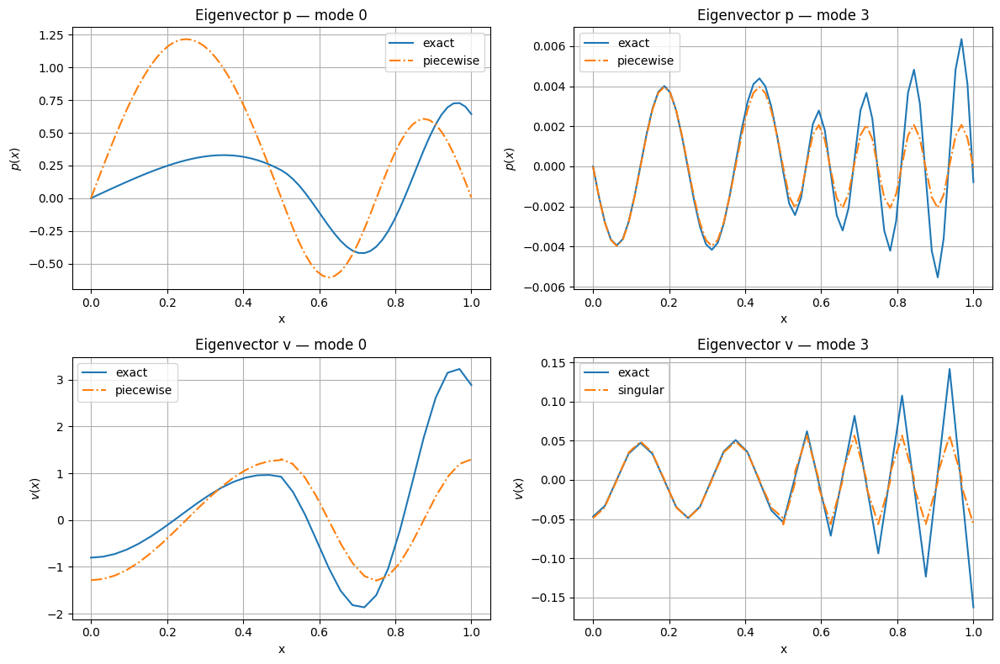

$[Closest] idx=0  \omega=(12.564129378210504-0.1479878337801621j)  \epsilon_r=(1.892641703450438+0j)$
$[Closest] idx=26  \omega=(50.31425937924156-0.15260018939583658j)  \epsilon_r=(1.6747655013775038+0j)$


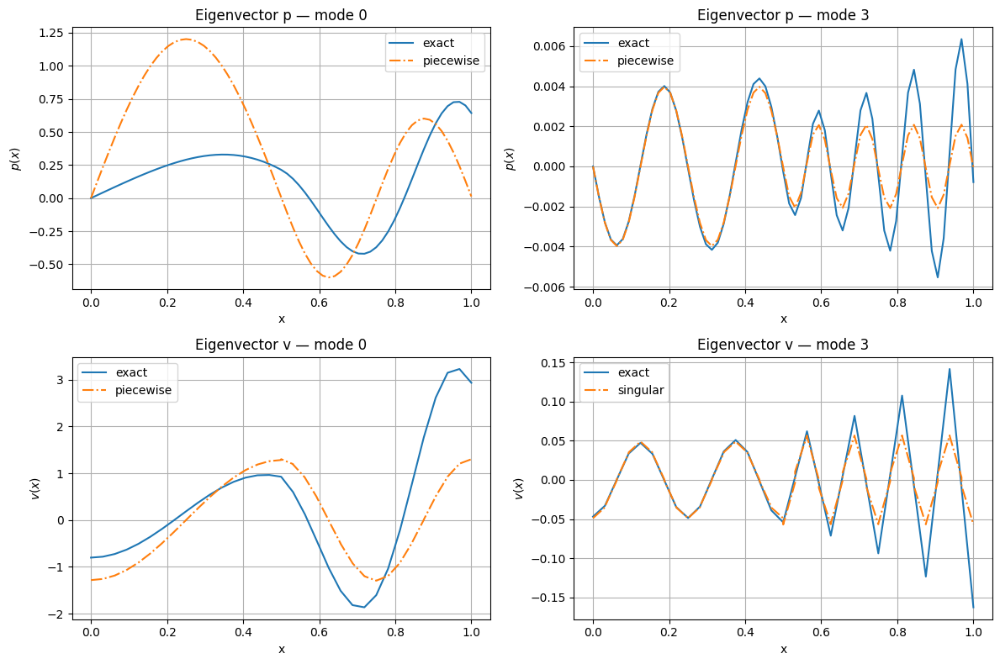

$[Closest] idx=0  \omega=(12.563962549763877-0.19637862575608506j)  \epsilon_r=(1.8183097819680683+0j)$
$[Closest] idx=26  \omega=(50.31291446456748-0.20252628730177932j)  \epsilon_r=(1.6087037403444735+0j)$


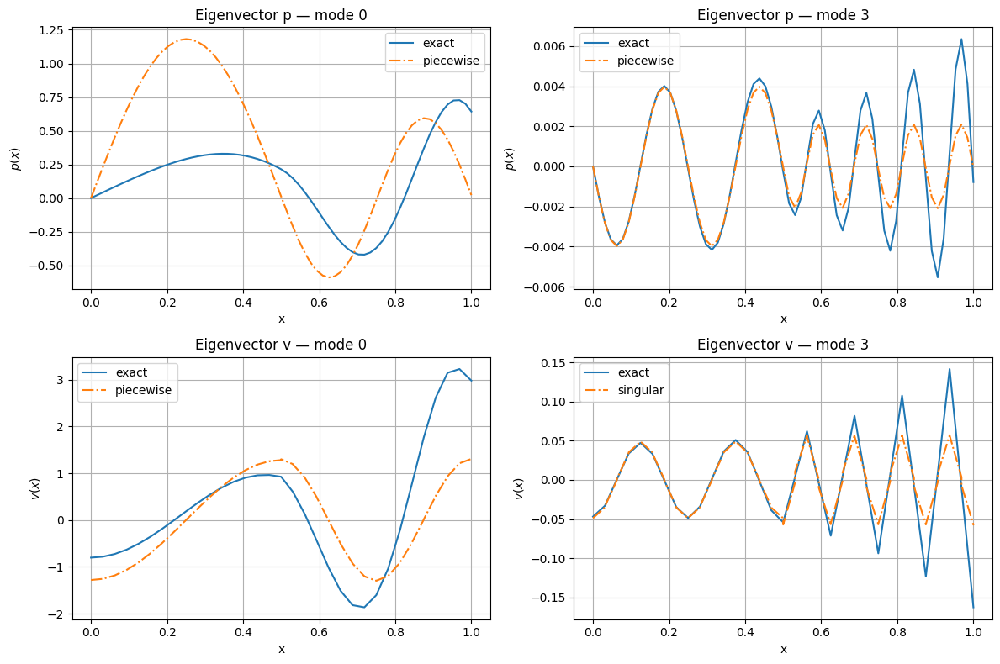

$[Closest] idx=0  \omega=(12.563748092870064-0.24469485010856645j)  \epsilon_r=(1.7467256265186184+0j)$
$[Closest] idx=26  \omega=(50.31118463292878-0.252398460180649j)  \epsilon_r=(1.5448669694672046+0j)$


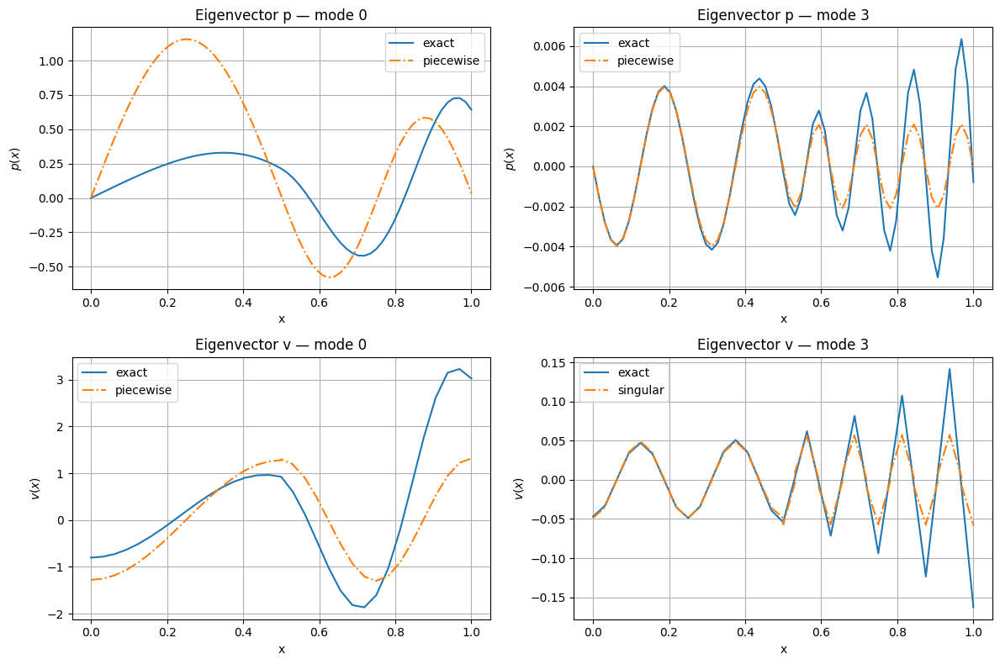

$[Closest] idx=0  \omega=(12.56348551051614-0.2929177703604023j)  \epsilon_r=(1.677750747486074+0j)$
$[Closest] idx=26  \omega=(50.309065137477596-0.3022031492828898j)  \epsilon_r=(1.483170108344125+0j)$


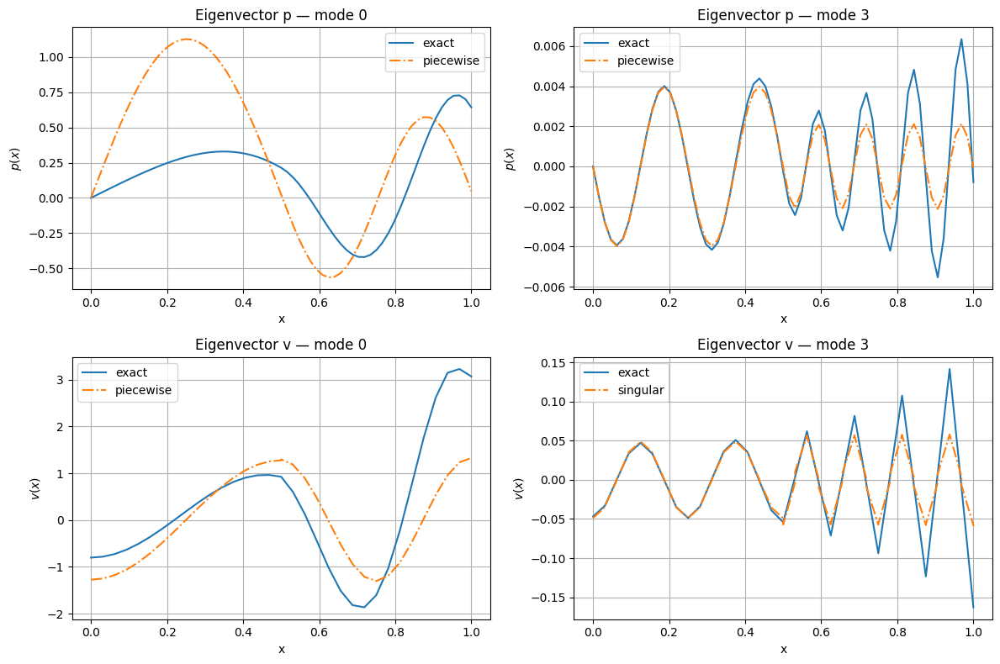

$[Closest] idx=0  \omega=(12.563174194911138-0.34102842732844296j)  \epsilon_r=(1.6112551089544305+0j)$
$[Closest] idx=26  \omega=(50.30655013621135-0.351926624246901j)  \epsilon_r=(1.4235324305548835+0j)$


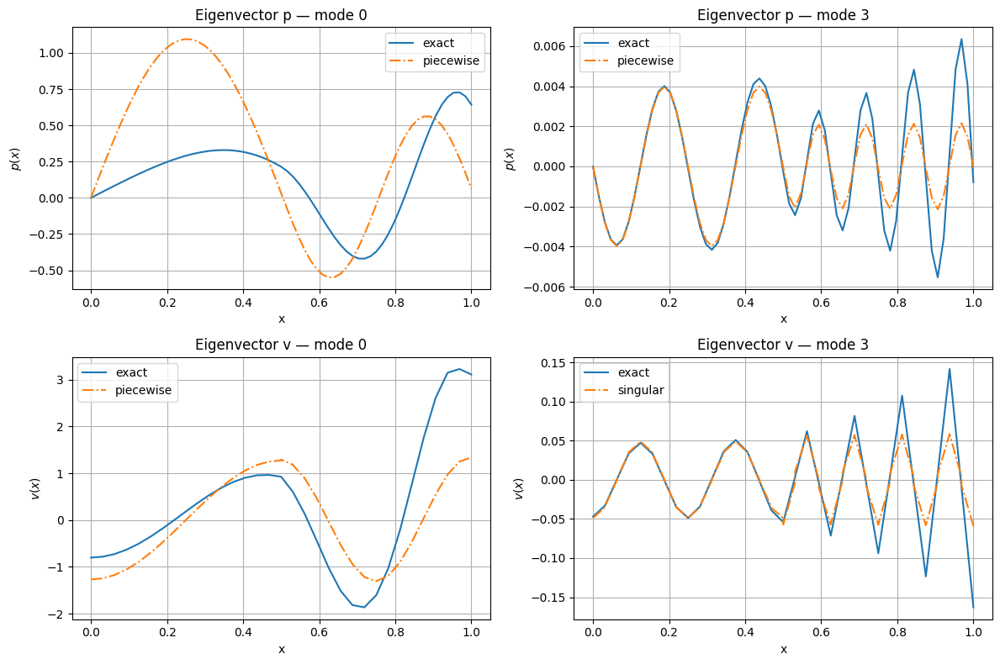

$[Closest] idx=0  \omega=(12.562813426644363-0.38900759424478565j)  \epsilon_r=(1.5471167602279017+0j)$
$[Closest] idx=26  \omega=(50.30363266018774-0.40155494378709555j)  \epsilon_r=(1.3658776459143653+0j)$


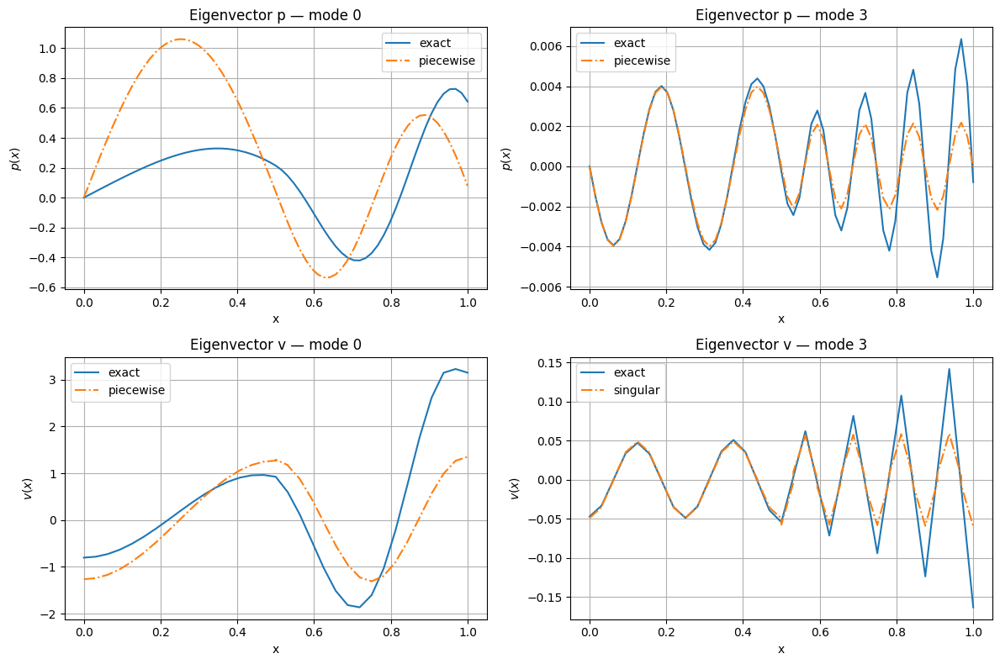

$[Closest] idx=0  \omega=(12.562402373798923-0.43683573149809996j)  \epsilon_r=(1.4852214675902842+0j)$
$[Closest] idx=26  \omega=(50.300304575448656-0.45107391319982953j)  \epsilon_r=(1.310133986820696+0j)$


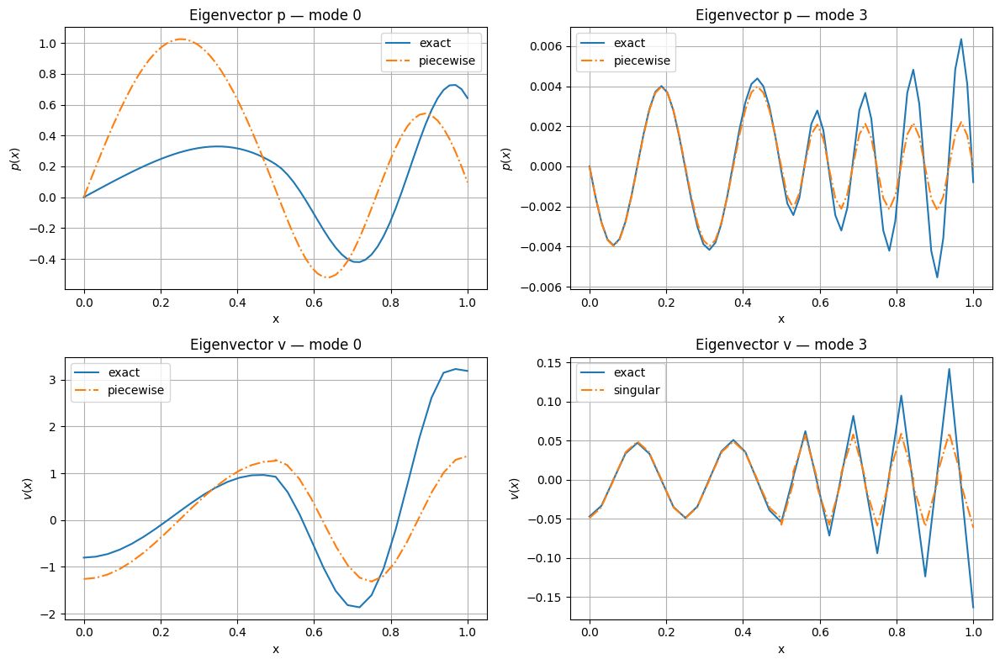

$[Closest] idx=0  \omega=(12.561940091080272-0.484492940979348j)  \epsilon_r=(1.4254623509648099+0j)$
$[Closest] idx=26  \omega=(50.296556538370275-0.5004690379007617j)  \epsilon_r=(1.2562343039363641+0j)$


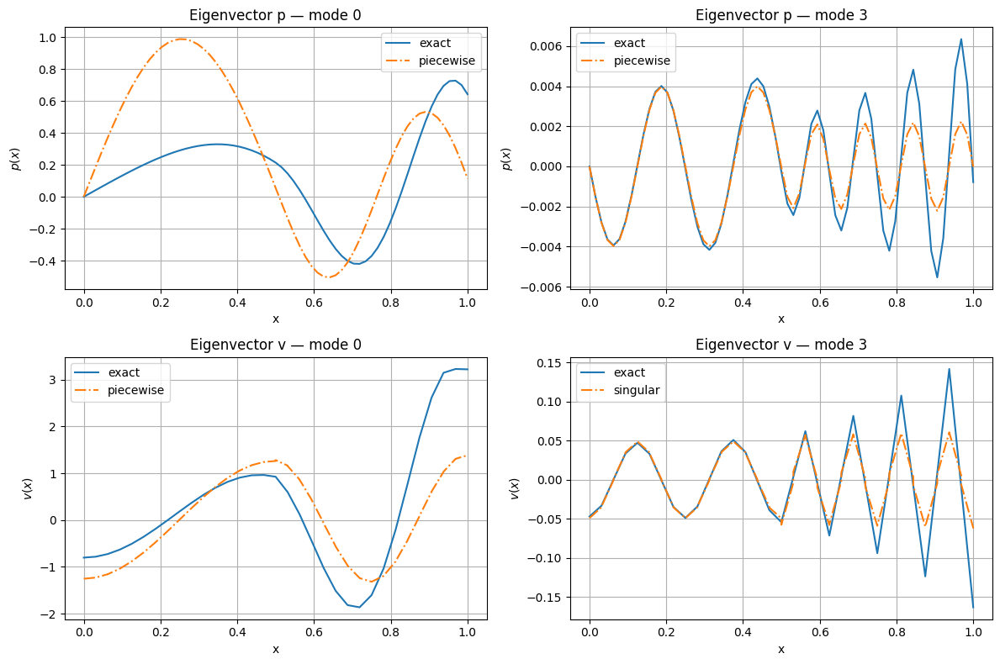

$[Closest] idx=0  \omega=(12.561425519032875-0.5319589200402078j)  \epsilon_r=(1.3677395289209757+0j)$
$[Closest] idx=26  \omega=(50.292377944105795-0.5497254720698754j)  \epsilon_r=(1.2041161768163908+0j)$


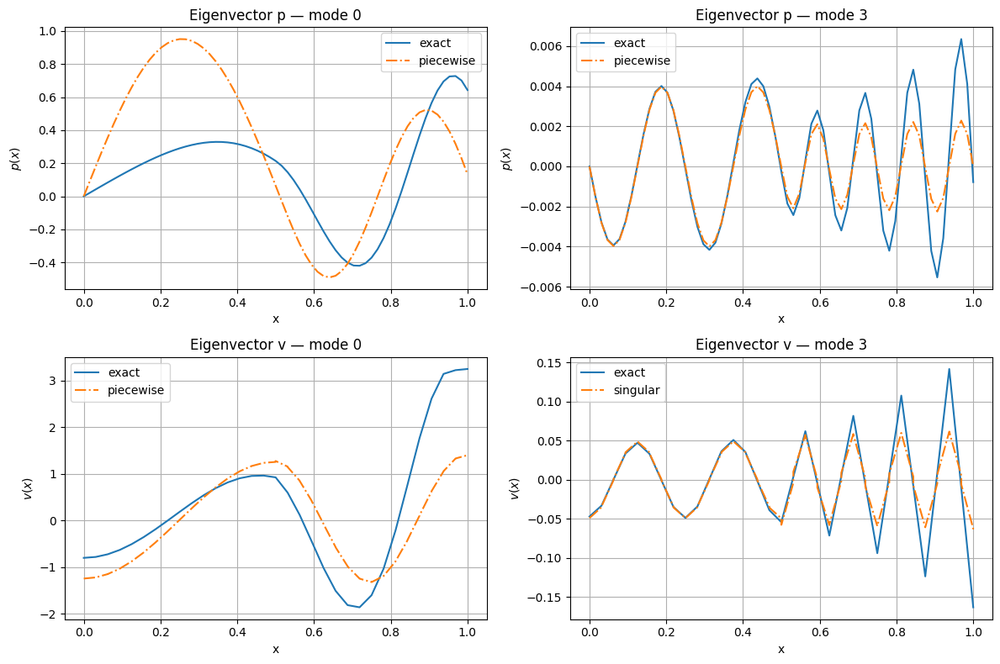

$[Closest] idx=0  \omega=(12.560857483435141-0.579212915102941j)  \epsilon_r=(1.3119597745157456+0j)$
$[Closest] idx=26  \omega=(50.28775686773889-0.598827961308373j)  \epsilon_r=(1.153722045582779+0j)$


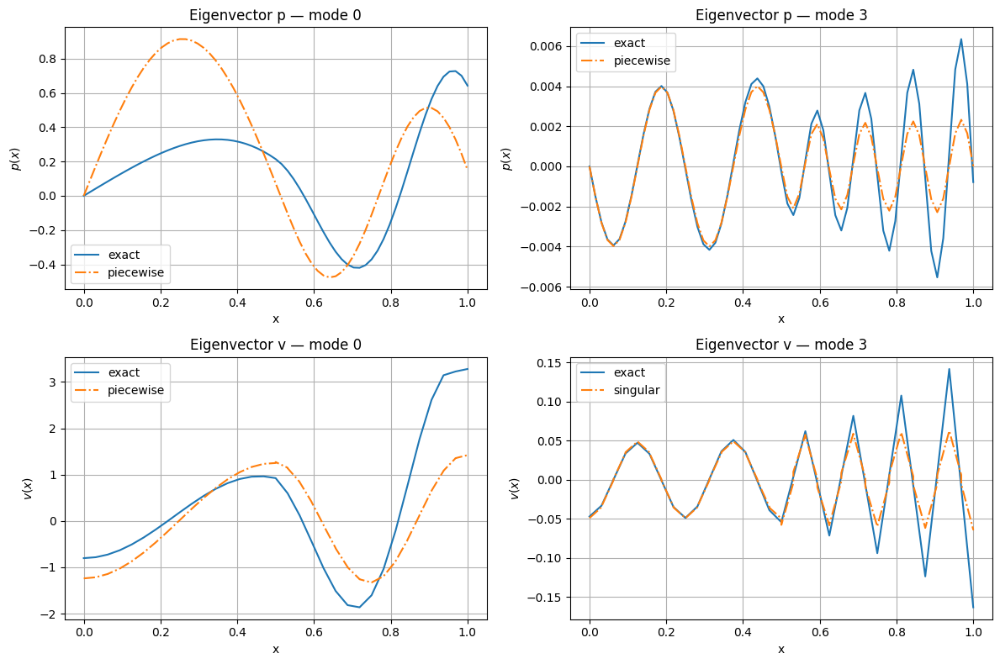

$[Closest] idx=0  \omega=(12.560234694981716-0.6262336749971344j)  \epsilon_r=(1.258036183703748+0j)$
$[Closest] idx=26  \omega=(50.28267999771674-0.647760777994455j)  \epsilon_r=(1.1049993703430858+0j)$


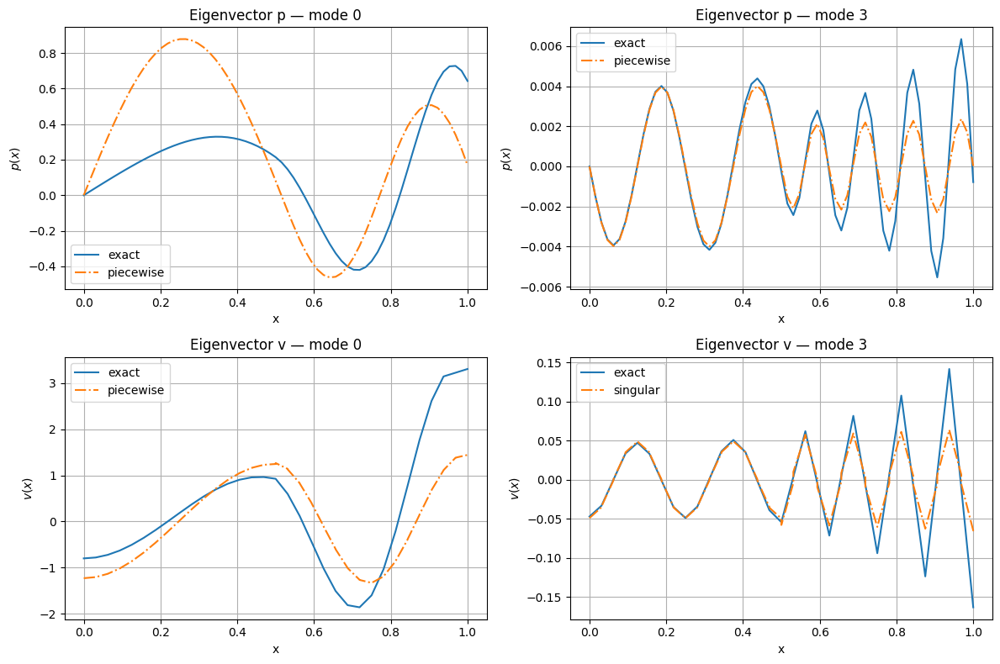

$[Closest] idx=0  \omega=(12.559555749384312-0.6729994041432509j)  \epsilon_r=(1.205887857461947+0j)$
$[Closest] idx=26  \omega=(50.27713256109032-0.6965076477613923j)  \epsilon_r=(1.0579008257425828+0j)$


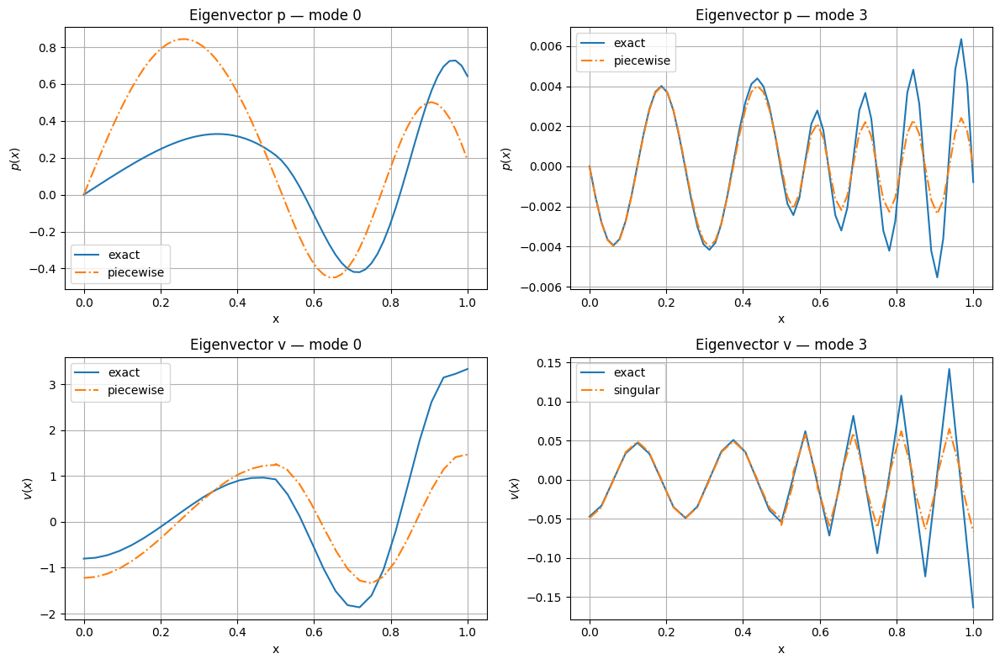

$[Closest] idx=0  \omega=(12.558819128048347-0.7194877157567724j)  \epsilon_r=(1.155439598314235+0j)$
$[Closest] idx=26  \omega=(50.27109824004408-0.7450516651875134j)  \epsilon_r=(1.0123845388155583+0j)$


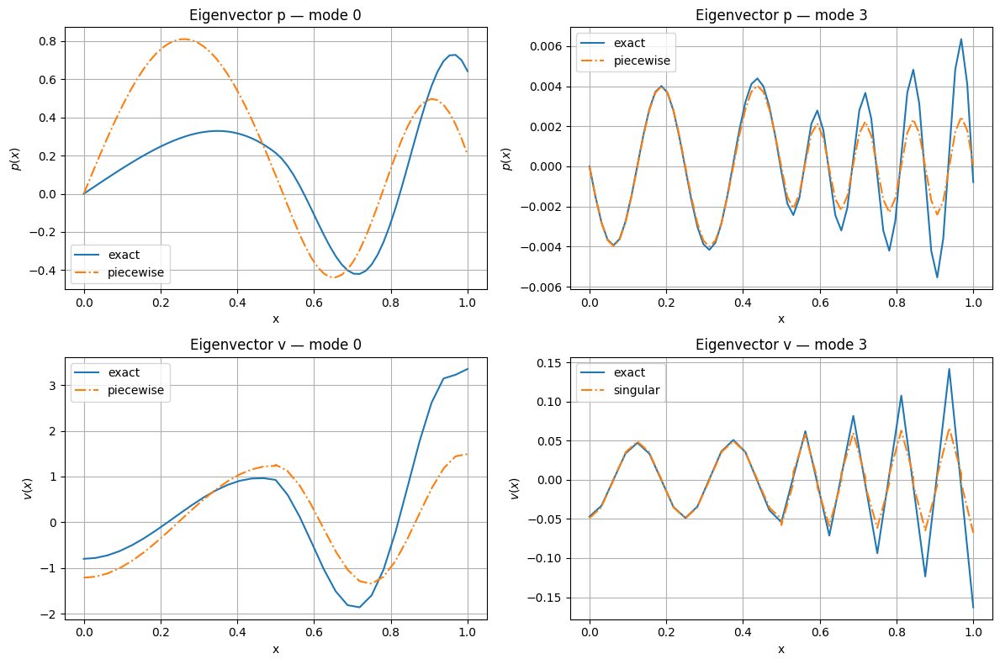

$[Closest] idx=0  \omega=(12.558023199512053-0.7656755853108294j)  \epsilon_r=(1.1066216215830766+0j)$
$[Closest] idx=26  \omega=(50.26455907916598-0.7933751963804062j)  \epsilon_r=(0.968414379101916+0j)$


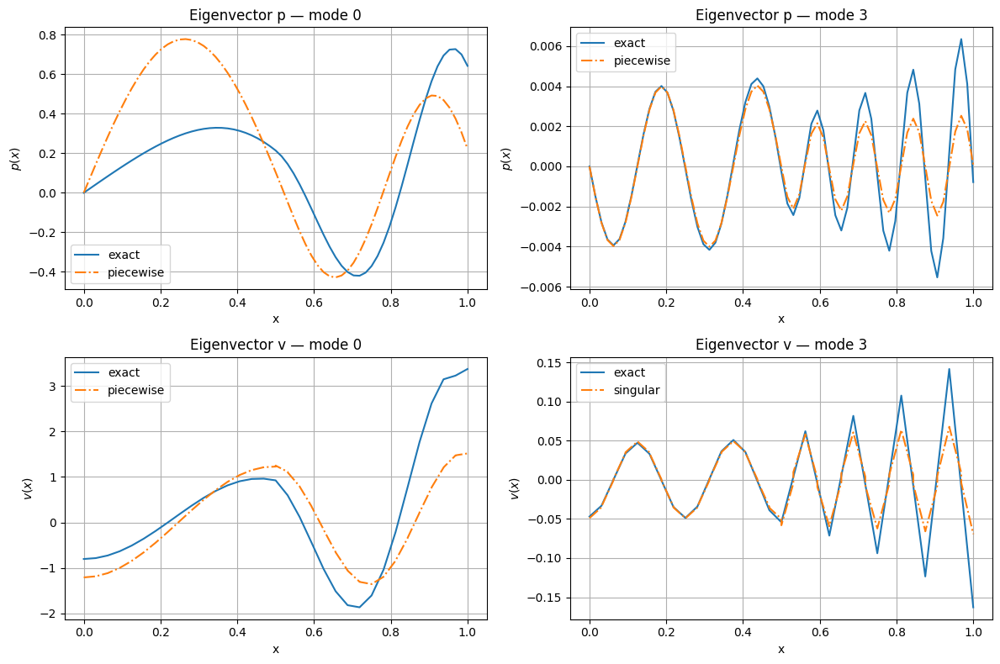

$[Closest] idx=0  \omega=(12.557166221869414-0.8115393045720714j)  \epsilon_r=(1.0593692814151008+0j)$
$[Closest] idx=26  \omega=(50.25749538289632-0.8414597656284553j)  \epsilon_r=(0.9259603107560437+0j)$


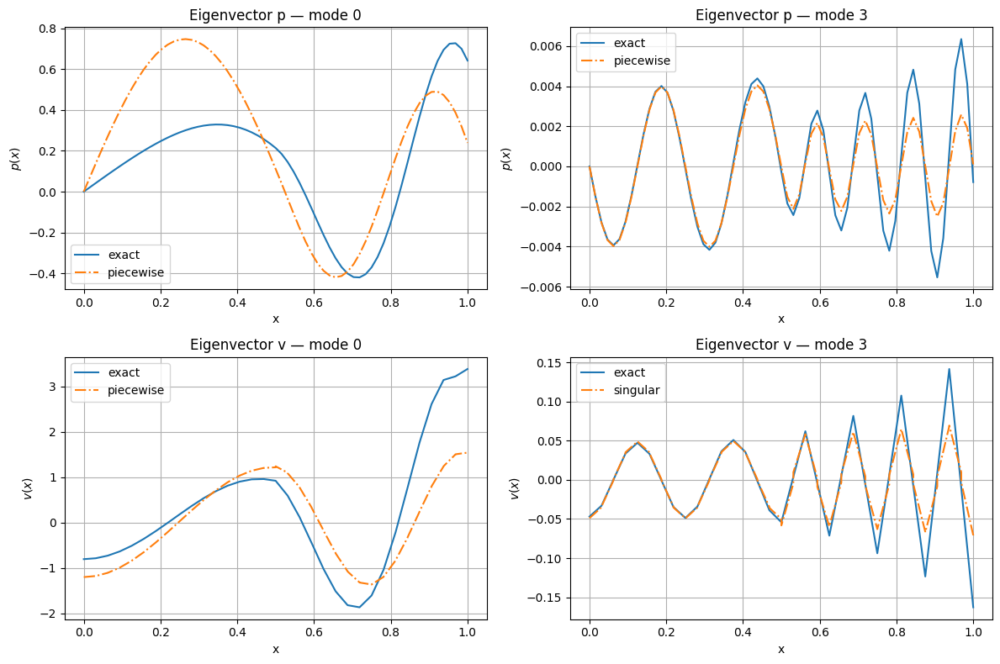

$[Closest] idx=0  \omega=(12.556246346436584-0.857054436614932j)  \epsilon_r=(1.0136228114078516+0j)$
$[Closest] idx=26  \omega=(50.24988560260178-0.8892859226617812j)  \epsilon_r=(0.8849988169397266+0j)$


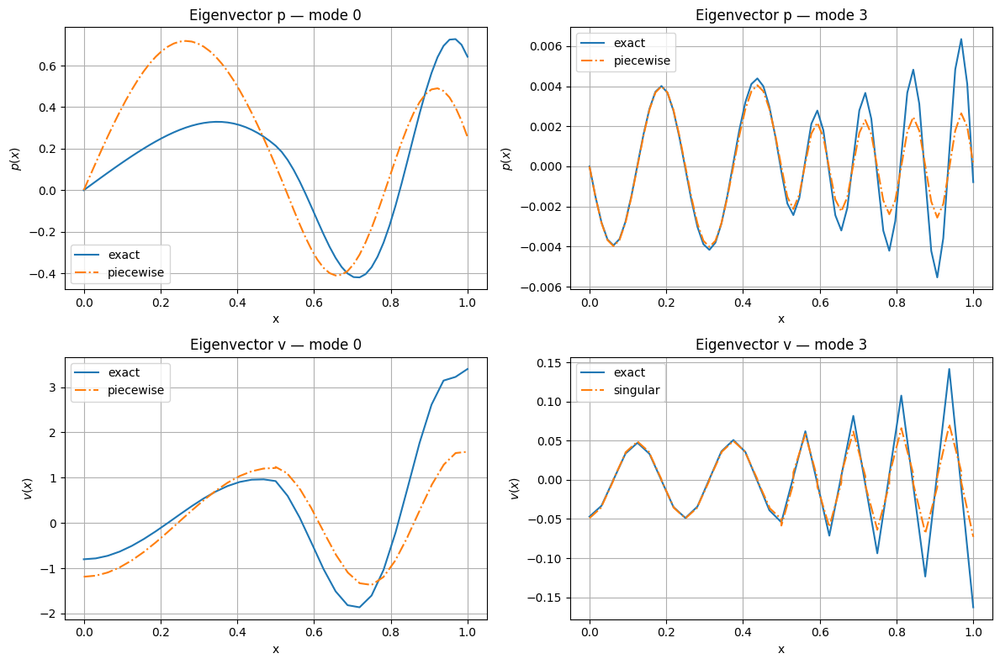

$[Closest] idx=0  \omega=(12.555261622965773-0.9021957723267795j)  \epsilon_r=(0.969327079489303+0j)$
$[Closest] idx=26  \omega=(50.24170621276874-0.9368330862771519j)  \epsilon_r=(0.8455134069497481+0j)$


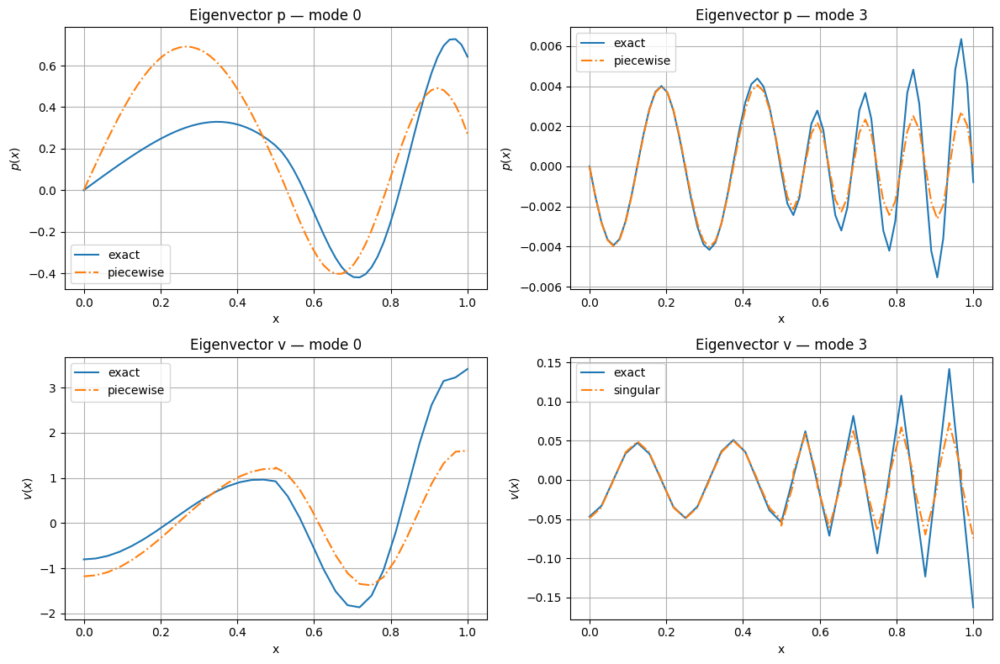

$[Closest] idx=0  \omega=(12.554210006759265-0.9469372890416795j)  \epsilon_r=(0.9264313565590294+0j)$
$[Closest] idx=26  \omega=(50.232931575937776-0.9840793591010484j)  \epsilon_r=(0.8074952159276836+0j)$


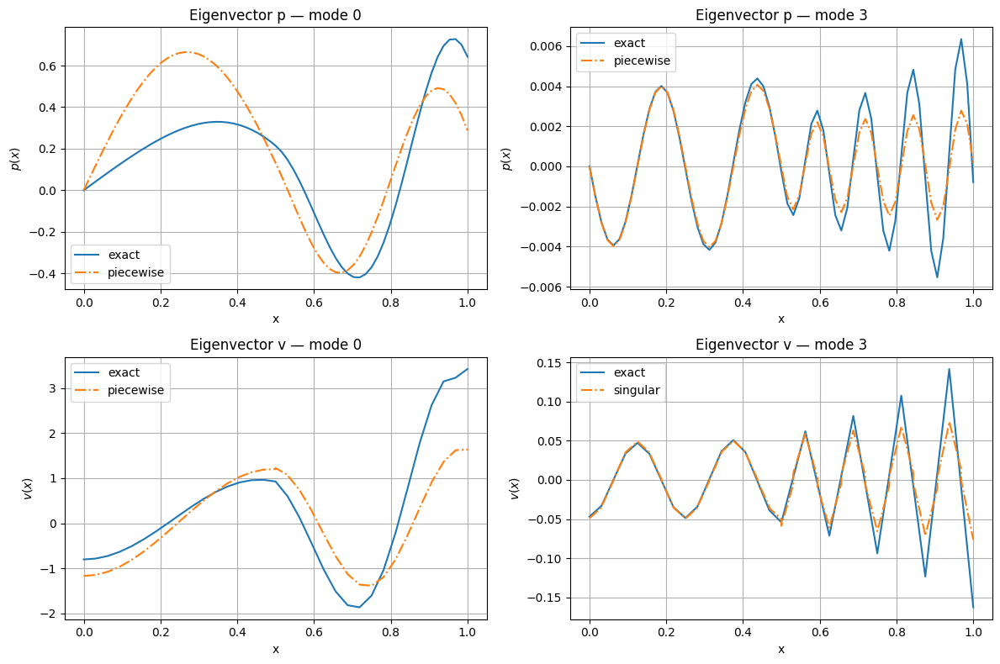

$[Closest] idx=0  \omega=(12.55308936808952-0.9912521120862682j)  \epsilon_r=(0.8848890982795385+0j)$
$[Closest] idx=26  \omega=(50.22353379619663-1.031001307039465j)  \epsilon_r=(0.7709437050998044+0j)$


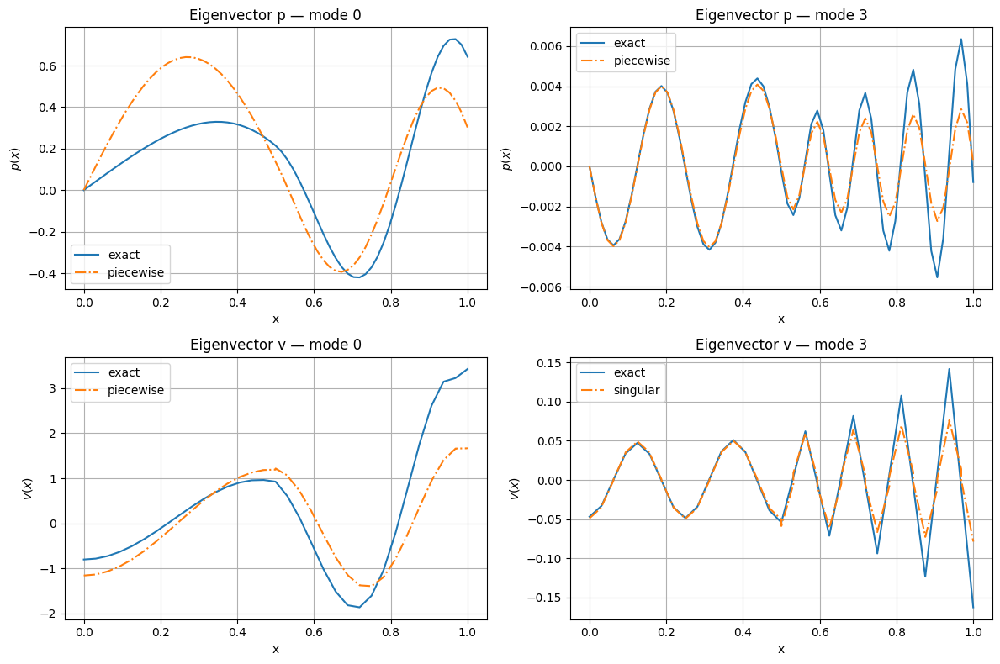

$[Closest] idx=0  \omega=(12.551897504389762-1.0351124801904543j)  \epsilon_r=(0.8446577392989396+0j)$
$[Closest] idx=26  \omega=(50.21348256143543-1.0775736954195339j)  \epsilon_r=(0.7358674665307328+0j)$


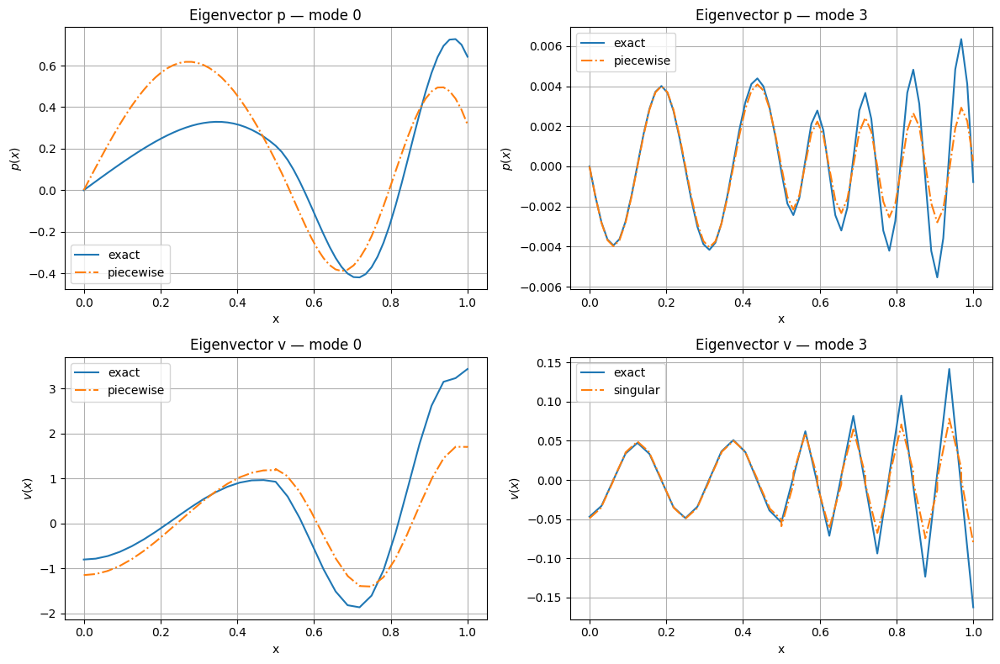

$[Closest] idx=0  \omega=(12.550632155739358-1.0784897159088602j)  \epsilon_r=(0.8056984990862626+0j)$
$[Closest] idx=26  \omega=(50.2027449751359-1.1237691719052652j)  \epsilon_r=(0.7022851292296339+0j)$


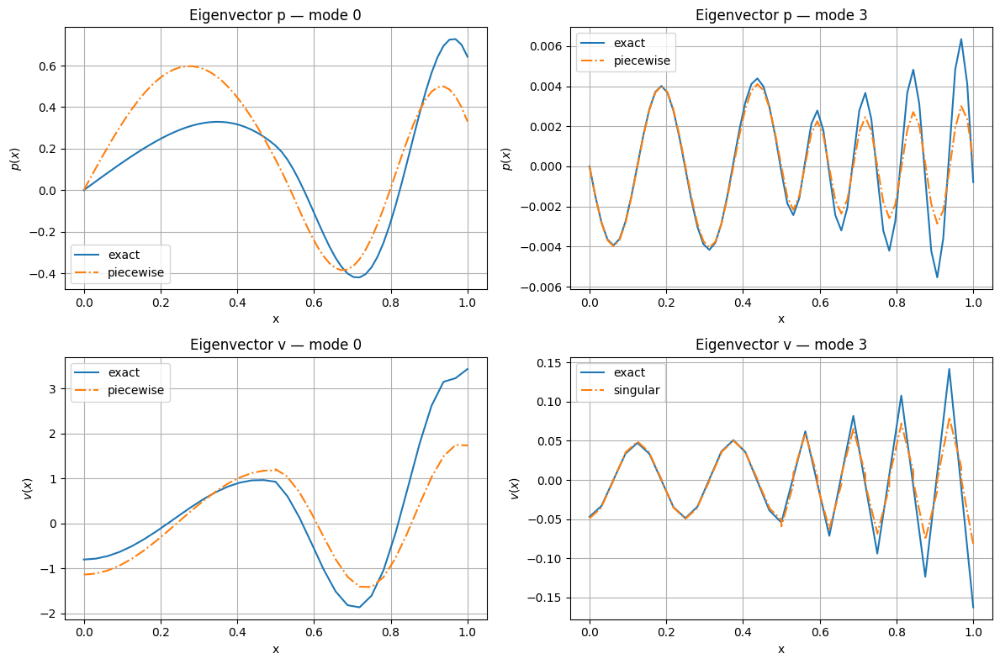

$[Closest] idx=0  \omega=(12.54929102423054-1.1213542024189818j)  \epsilon_r=(0.7679761984607936+0j)$
$[Closest] idx=26  \omega=(50.191285379405016-1.169557883833907j)  \epsilon_r=(0.6702263516644826+0j)$


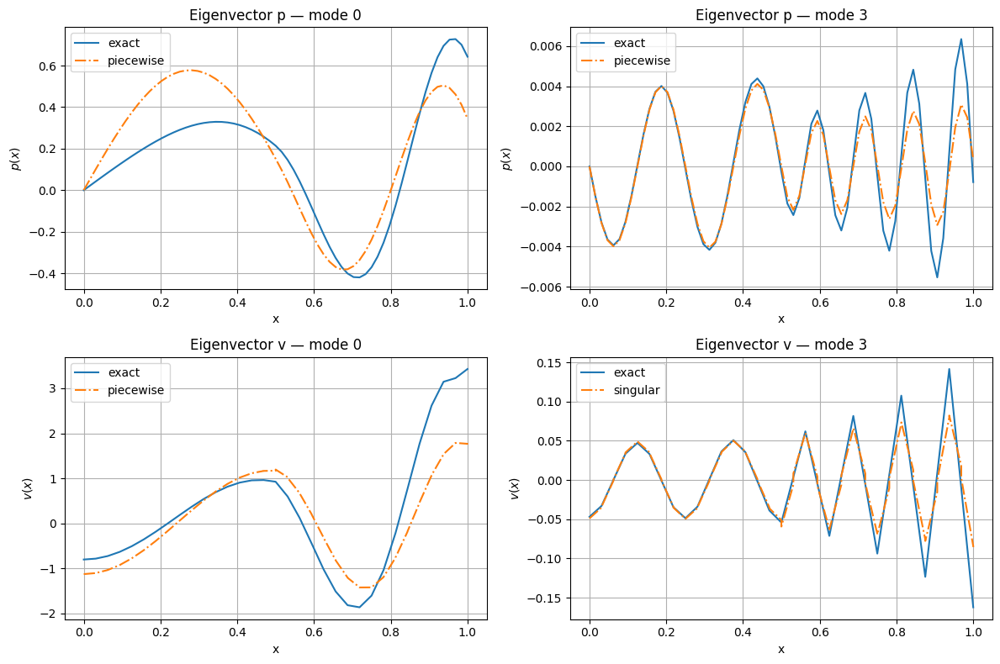

$[Closest] idx=0  \omega=(12.547871797862387-1.1636753683093768j)  \epsilon_r=(0.7314590857919974+0j)$
$[Closest] idx=26  \omega=(50.179065172395084-1.2149070145768812j)  \epsilon_r=(0.6397328674405893+0j)$


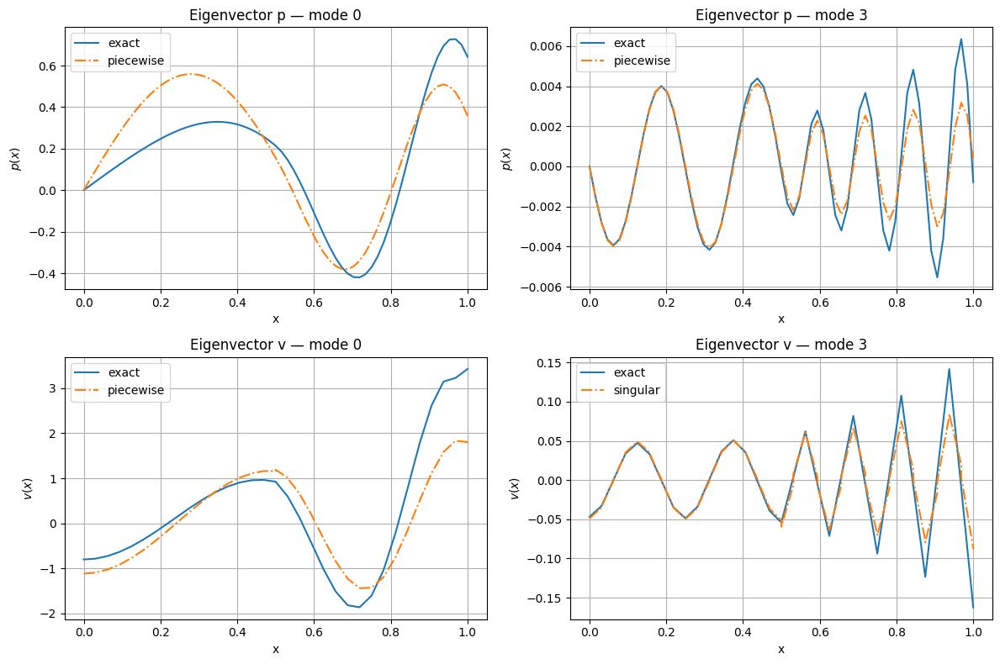

$[Closest] idx=0  \omega=(12.546372179661512-1.2054216822447719j)  \epsilon_r=(0.696118671732399+0j)$
$[Closest] idx=26  \omega=(50.1660426254389-1.2597802196885683j)  \epsilon_r=(0.6108595239879191+0j)$


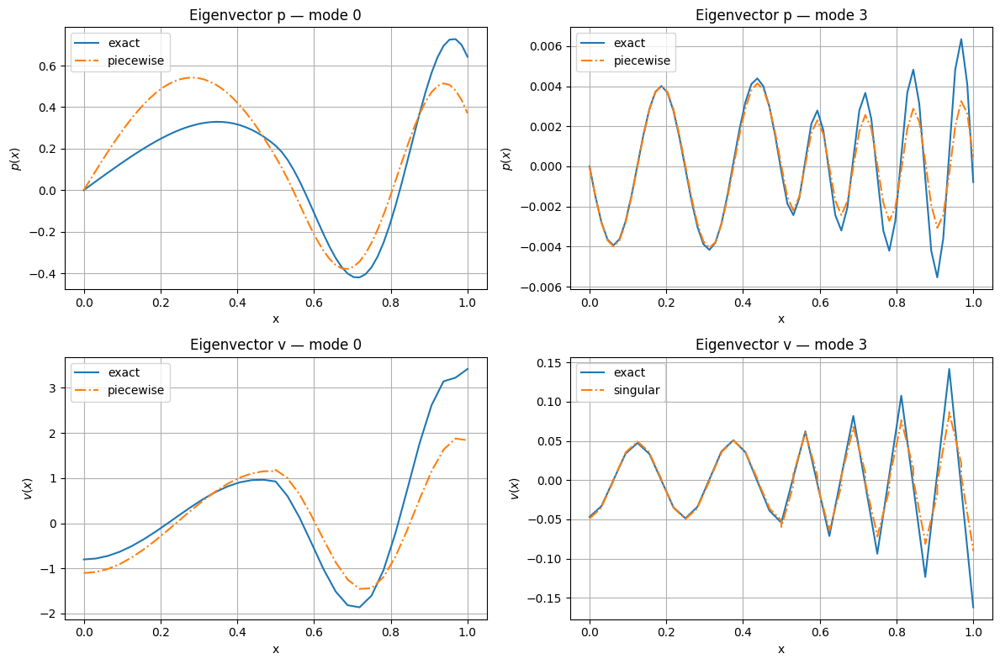

$[Closest] idx=0  \omega=(12.544789922770166-1.246560659694453j)  \epsilon_r=(0.6619295712164227+0j)$
$[Closest] idx=26  \omega=(50.15217270855729-1.3041369388230215j)  \epsilon_r=(0.5836752166201198+0j)$


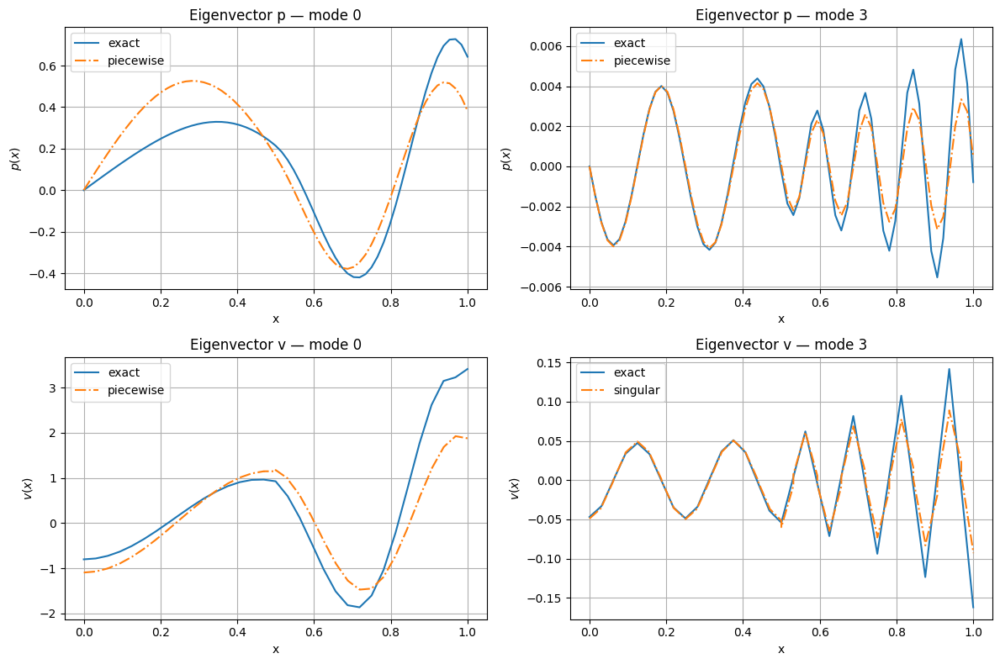

$[Closest] idx=0  \omega=(12.543122872263428-1.2870588842286883j)  \epsilon_r=(0.6288693513114317+0j)$
$[Closest] idx=26  \omega=(50.13740693801652-1.34793155343809j)  \epsilon_r=(0.5582635713546958+0j)$


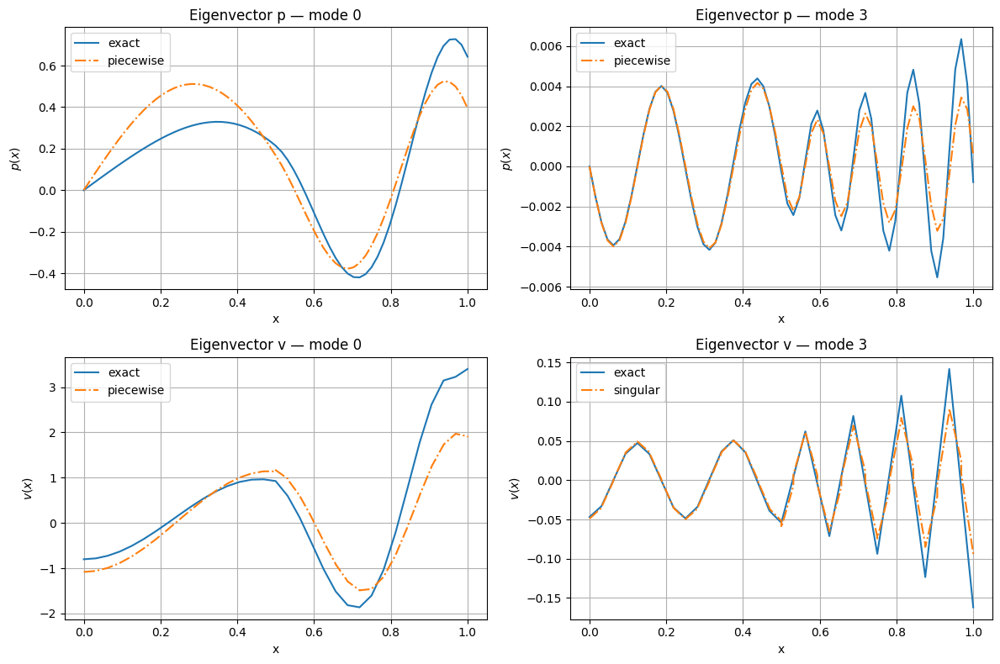

$[Closest] idx=0  \omega=(12.541369014448563-1.326882046220596j)  \epsilon_r=(0.5969183833356404+0j)$
$[Closest] idx=26  \omega=(50.121693267193656-1.3911123530074958j)  \epsilon_r=(0.5347231709948526+0j)$


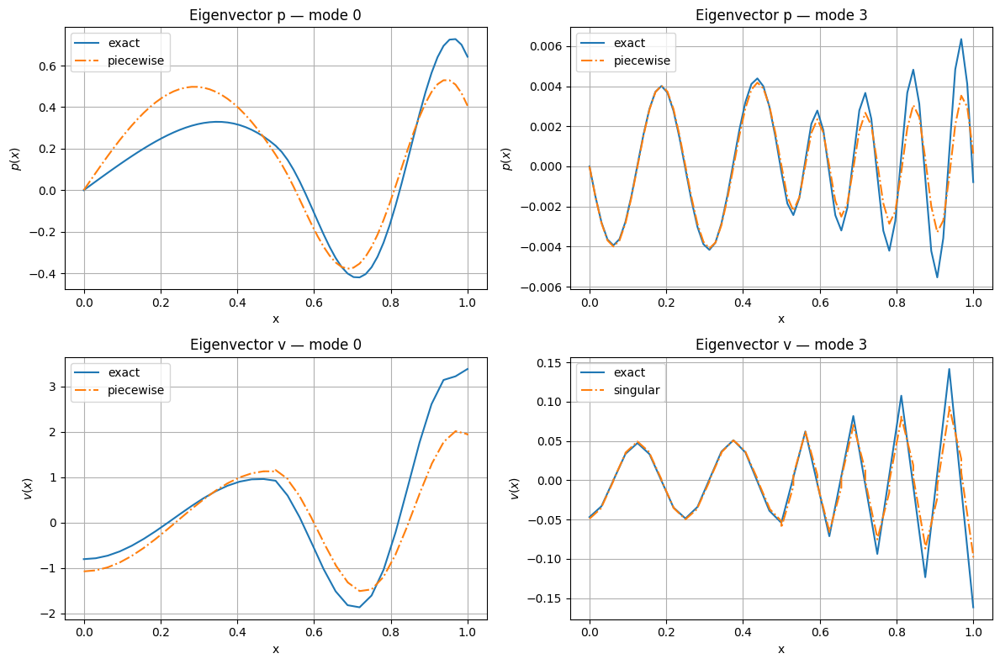

$[Closest] idx=0  \omega=(12.539526534346628-1.365995002122332j)  \epsilon_r=(0.566059697460114+0j)$
$[Closest] idx=26  \omega=(50.10497605339022-1.4336202636907738j)  \epsilon_r=(0.5131670564714869+0j)$


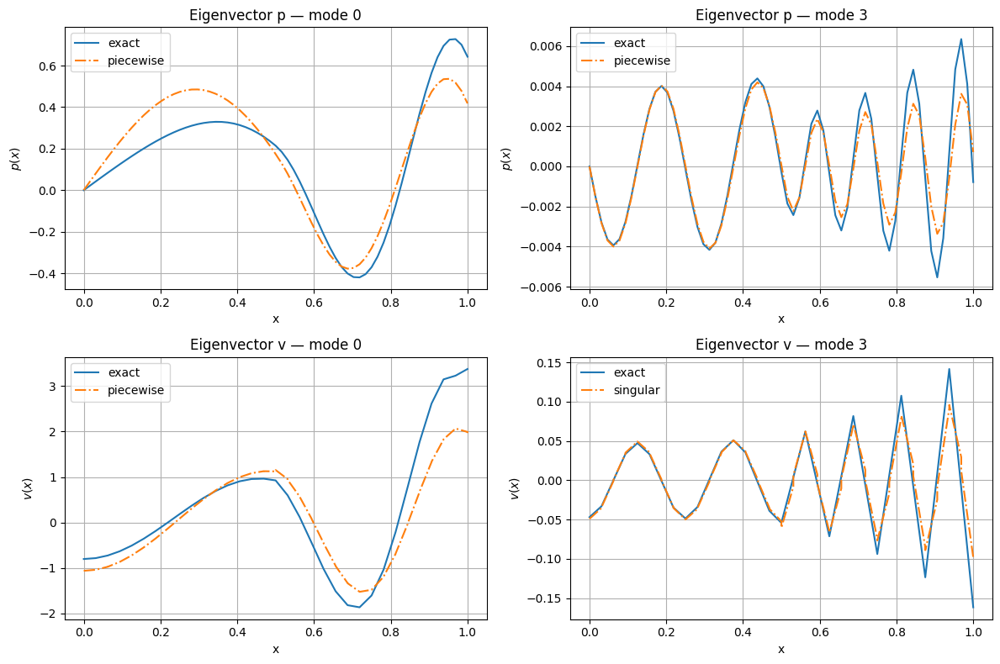

$[Closest] idx=0  \omega=(12.53759388194646-1.4043618577993577j)  \epsilon_r=(0.5362788377816021+0j)$
$[Closest] idx=26  \omega=(50.087196150358714-1.475387283291968j)  \epsilon_r=(0.49372118276534976+0j)$


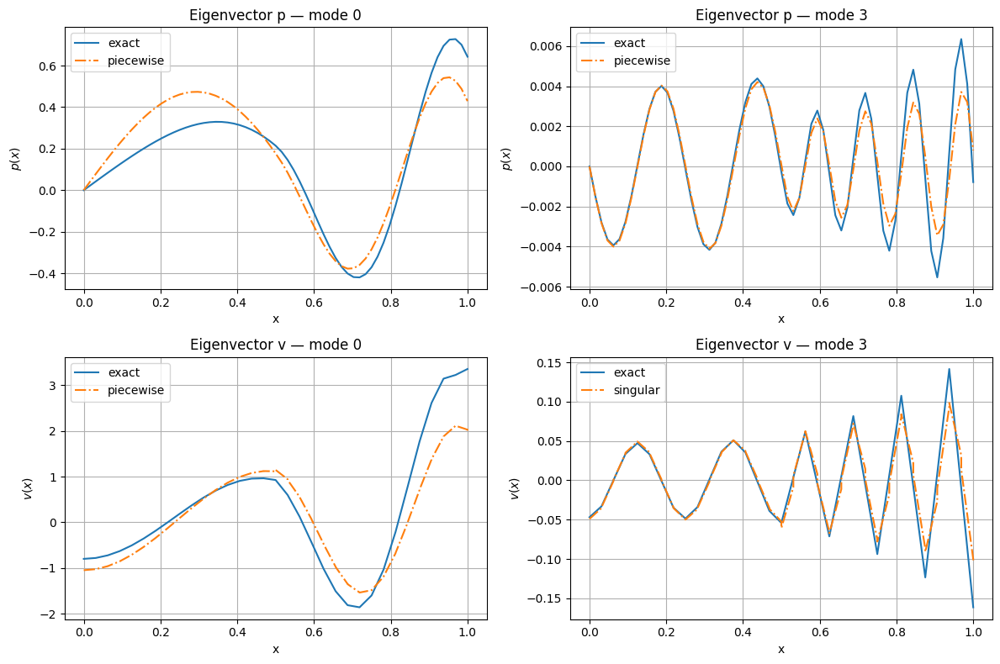

$[Closest] idx=0  \omega=(12.535569847633221-1.441946079679132j)  \epsilon_r=(0.5075637155856316+0j)$
$[Closest] idx=26  \omega=(50.06829120197721-1.5163345554363046j)  \epsilon_r=(0.4765214879969673+0j)$


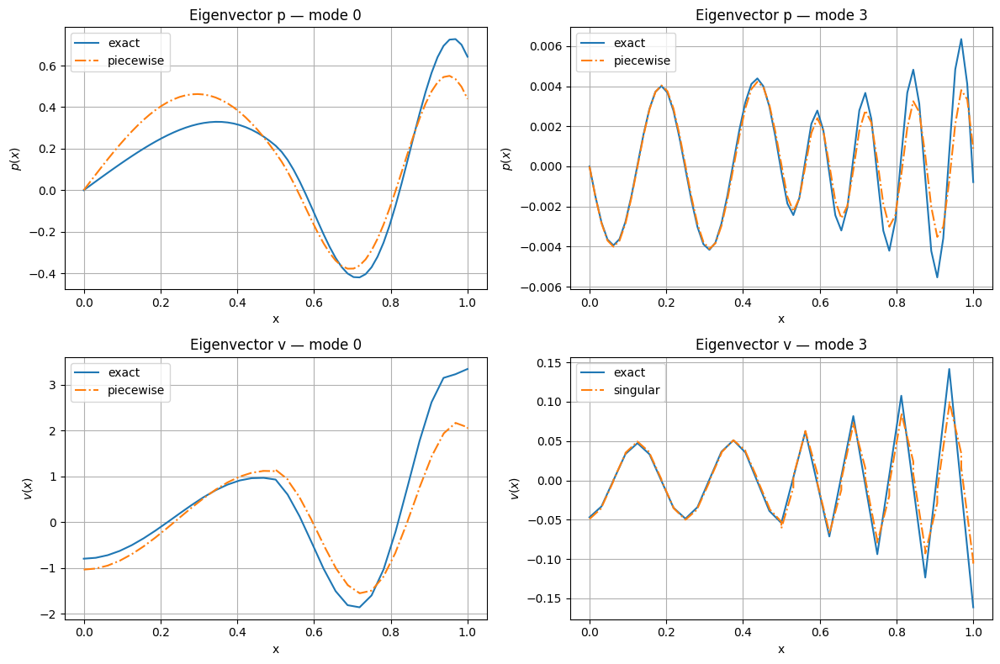

$[Closest] idx=0  \omega=(12.533453646909827-1.4787106376668273j)  \epsilon_r=(0.4799044582106993+0j)$
$[Closest] idx=26  \omega=(50.048196250849934-1.5563700058807084j)  \epsilon_r=(0.46170927429908565+0j)$


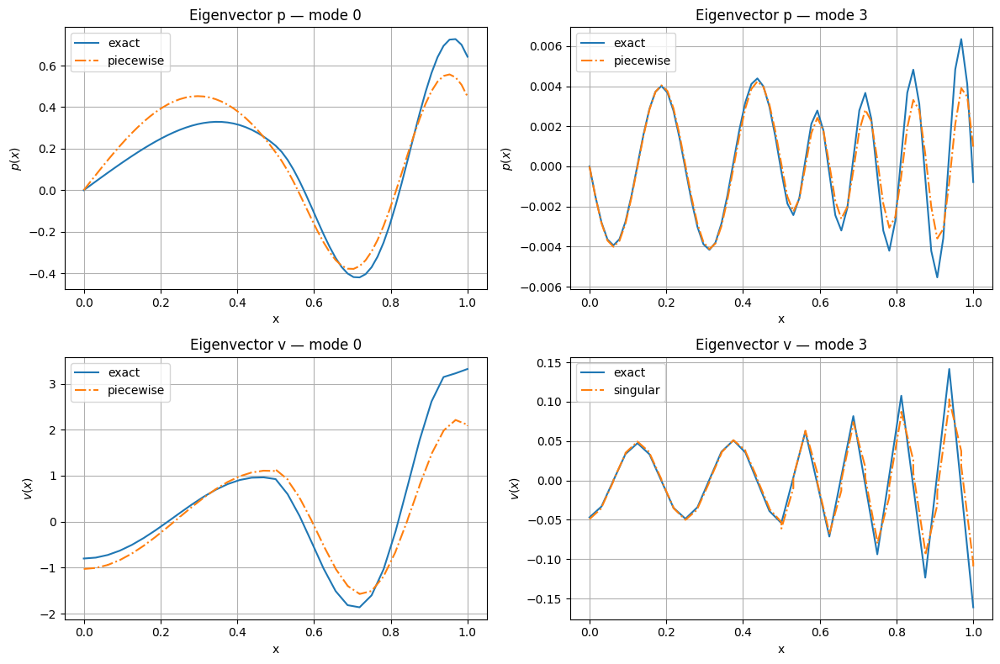

$[Closest] idx=0  \omega=(12.531245014128732-1.5146181838596091j)  \epsilon_r=(0.4532932505679408+0j)$
$[Closest] idx=25  \omega=(50.0268448325583-1.5953854584437581j)  \epsilon_r=(0.4494247271786376+0j)$


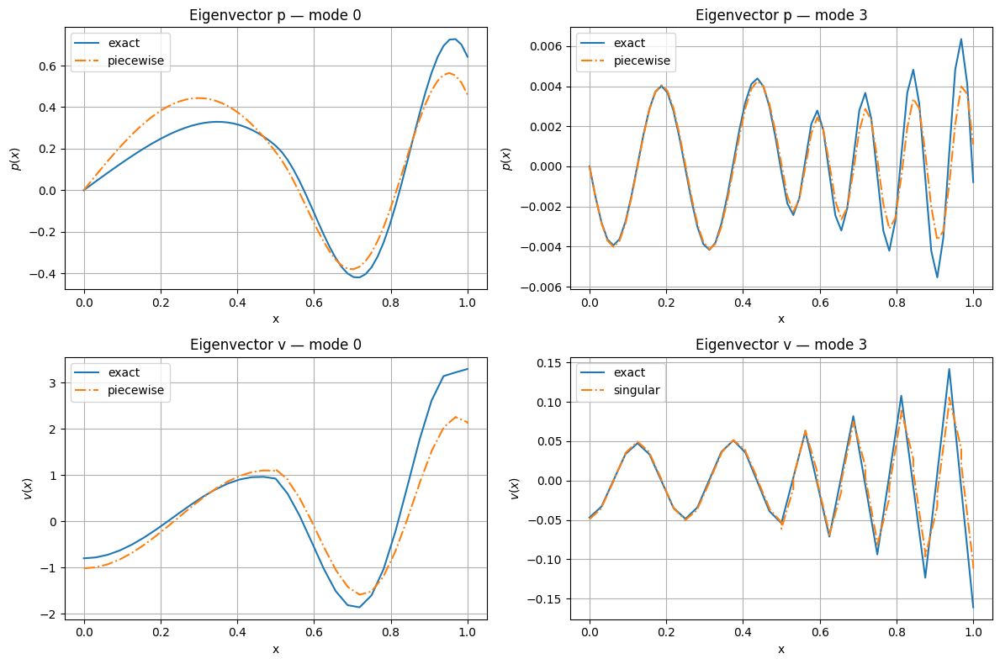

$[Closest] idx=0  \omega=(12.528944304414077-1.549631270997497j)  \epsilon_r=(0.4277241659637506+0j)$
$[Closest] idx=25  \omega=(50.00417080976642-1.6332531549562816j)  \epsilon_r=(0.43979862585628926+0j)$


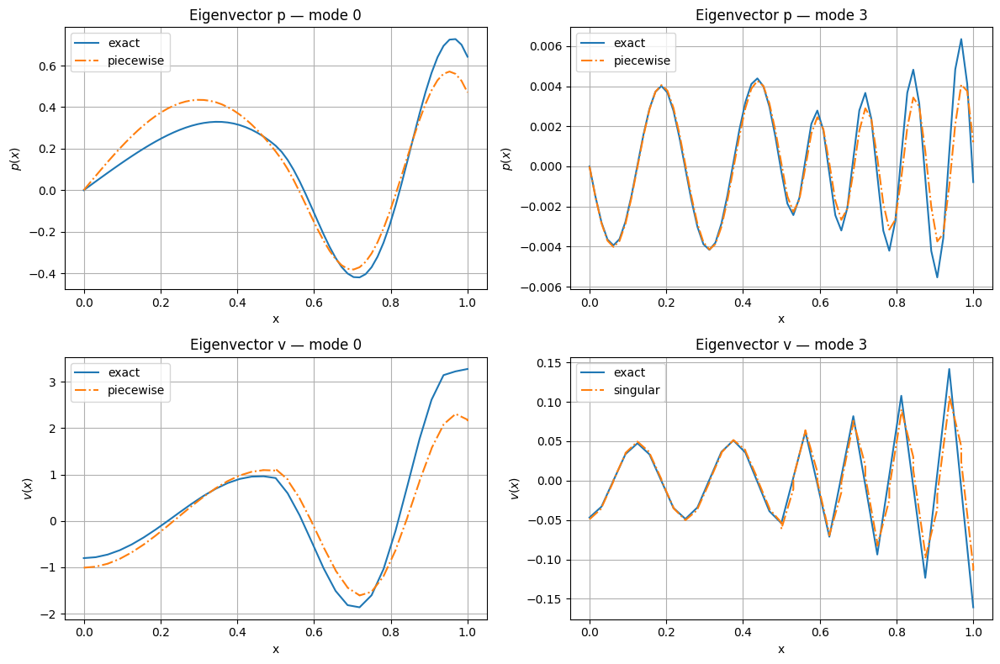

$[Closest] idx=0  \omega=(12.526552602267033-1.5837126142618574j)  \epsilon_r=(0.4031929824097096+0j)$
$[Closest] idx=25  \omega=(49.98011132023178-1.669821638082761j)  \epsilon_r=(0.43294259227417686+0j)$


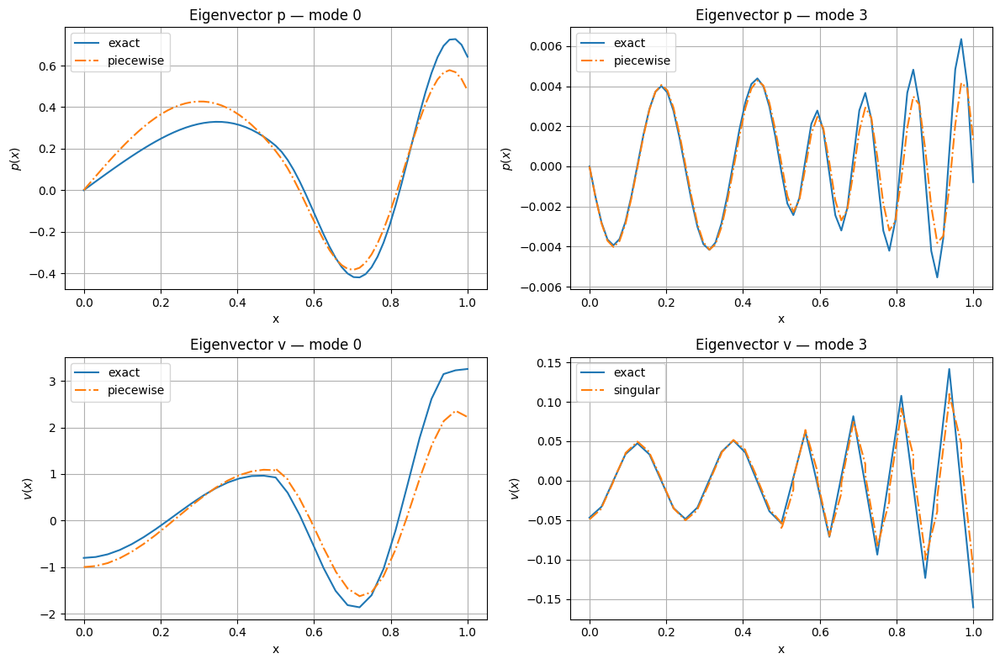

$[Closest] idx=0  \omega=(12.52407183450453-1.6168253993983097j)  \epsilon_r=(0.3796969800870037+0j)$
$[Closest] idx=25  \omega=(49.95461137829449-1.7049110463651578j)  \epsilon_r=(0.42893851197161037+0j)$


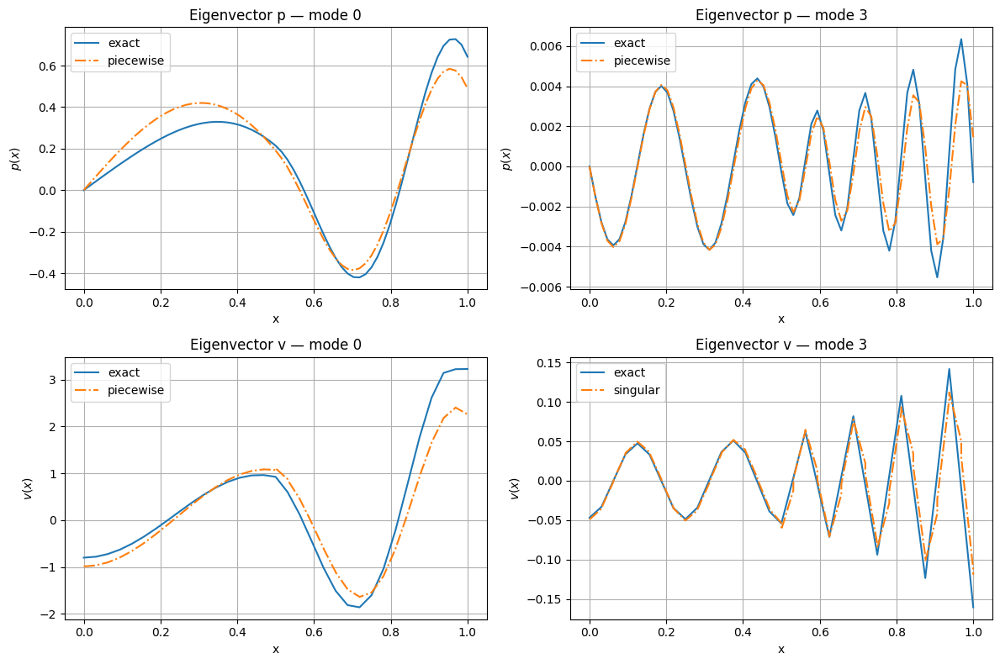

$[Closest] idx=0  \omega=(12.521504884195455-1.6489336391266707j)  \epsilon_r=(0.3572347150640818+0j)$
$[Closest] idx=25  \omega=(49.927630882226865-1.7383080681561687j)  \epsilon_r=(0.4278279161386562+0j)$


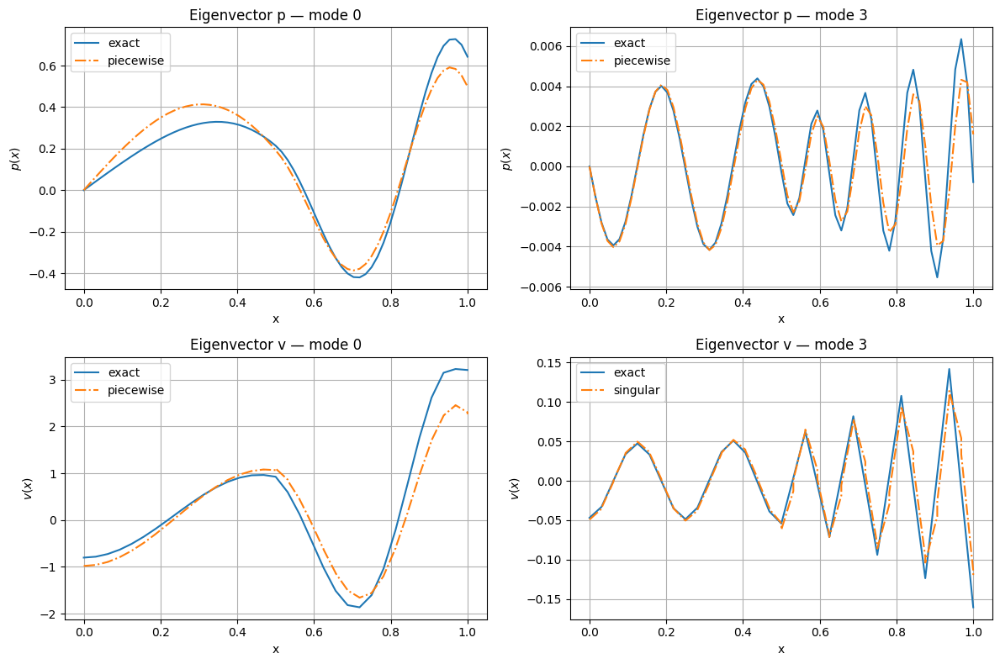

$[Closest] idx=0  \omega=(12.518855701159033-1.680002578330964j)  \epsilon_r=(0.3358057637655369+0j)$
$[Closest] idx=25  \omega=(49.89915501472062-1.7697611892781064j)  \epsilon_r=(0.4296020240556999+0j)$


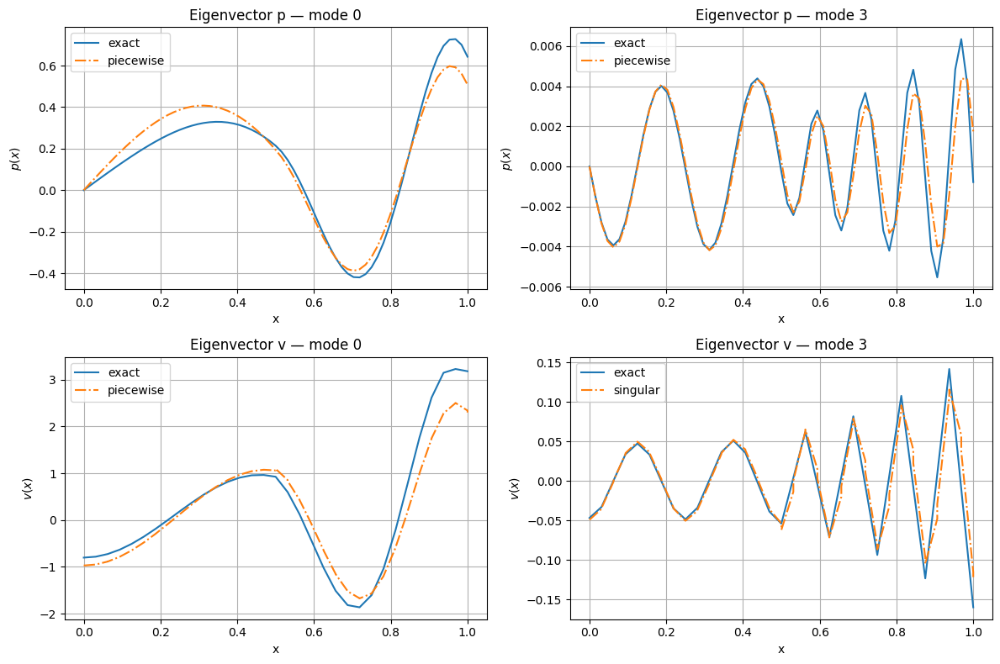

$[Closest] idx=0  \omega=(12.516129403443191-1.7099991465380275j)  \epsilon_r=(0.31541043209355746+0j)$
$[Closest] idx=25  \omega=(49.869209186835924-1.7989775709249287j)  \epsilon_r=(0.4341927662526191+0j)$


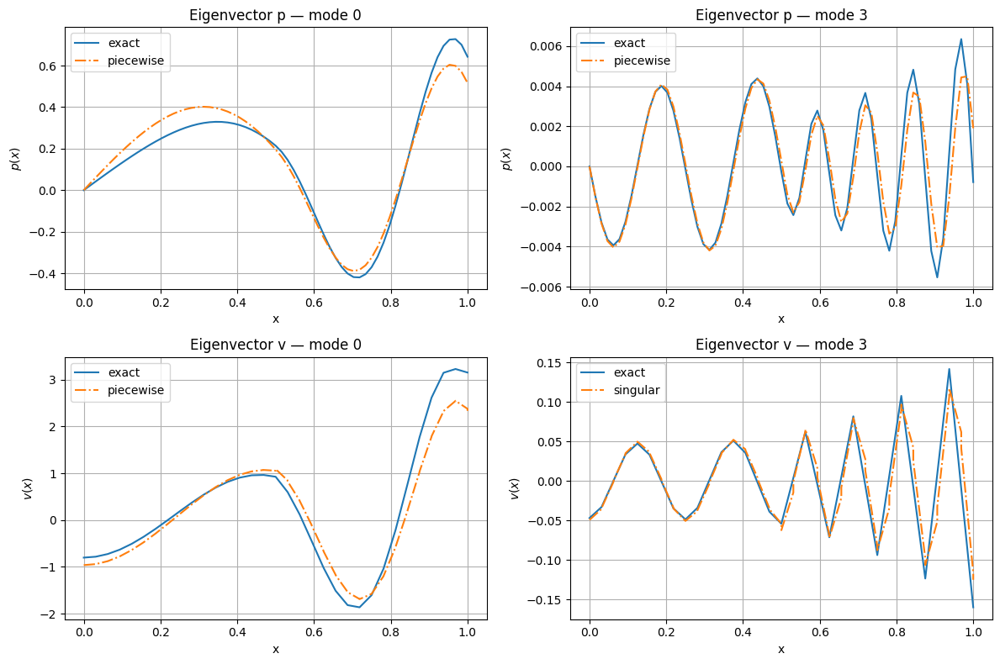

$[Closest] idx=0  \omega=(12.513332363097668-1.7388924536656725j)  \epsilon_r=(0.29604942257989286+0j)$
$[Closest] idx=25  \omega=(49.83787952446525-1.8256240435436406j)  \epsilon_r=(0.4414645571525426+0j)$


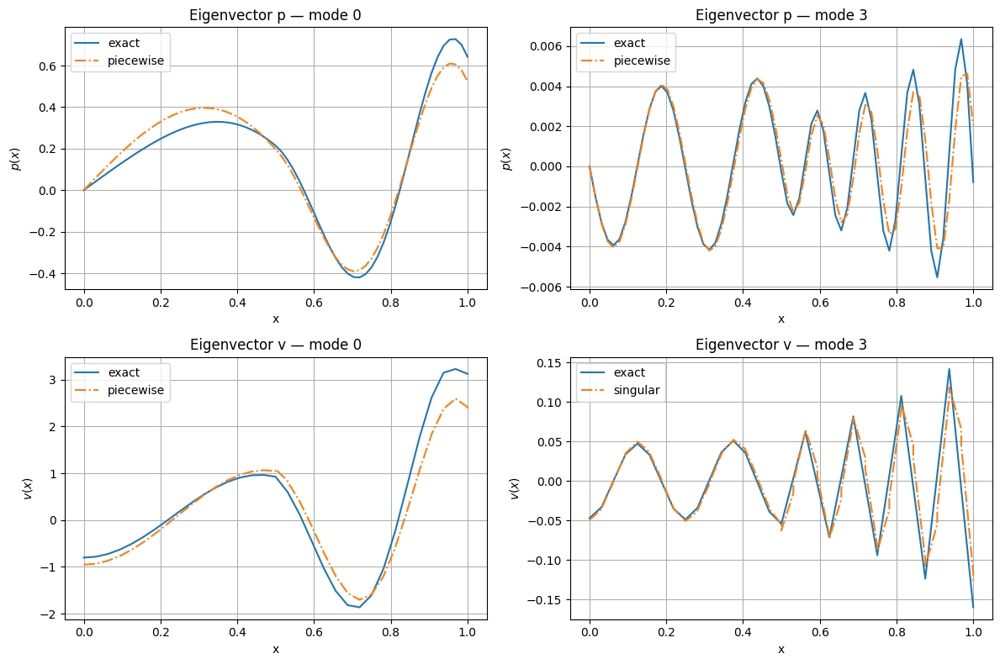


=== Executando para N = 3, h = 0.015625 ===
$[Closest] idx=0  \omega=(12.566054670463192-0.0998637961265058j)  \epsilon_r=(1.9829915827407896+0j)$
$[Closest] idx=26  \omega=(50.25798520567034-0.09889334000815327j)  \epsilon_r=(1.8550588214679027+0j)$


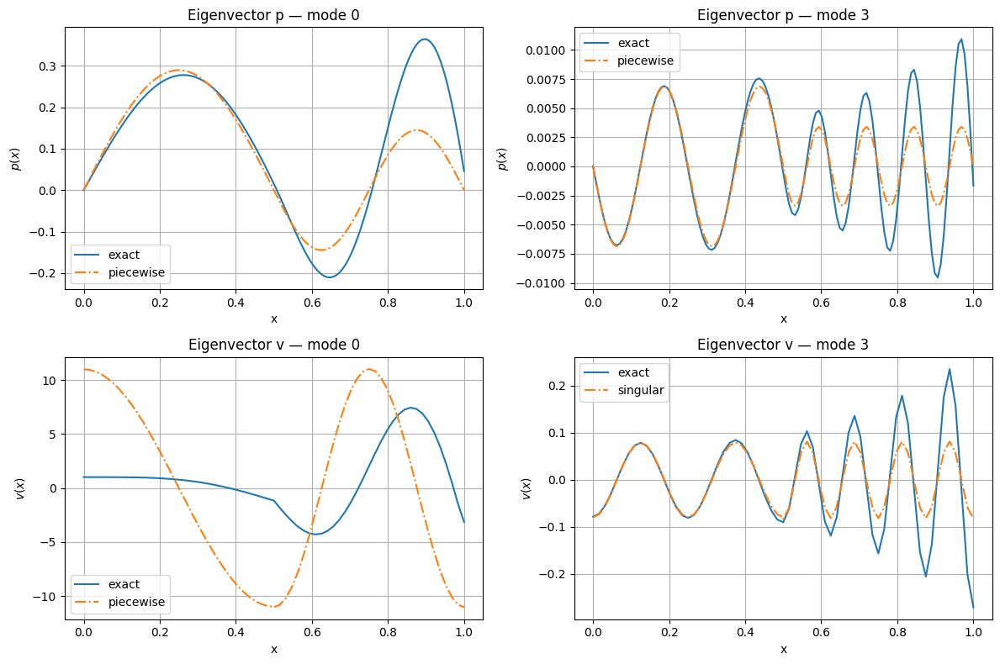

$[Closest] idx=0  \omega=(12.565997800866548-0.14846933496486353j)  \epsilon_r=(1.906122372911834+0j)$
$[Closest] idx=26  \omega=(50.2576711074744-0.14702416742579064j)  \epsilon_r=(1.781021524928145+0j)$


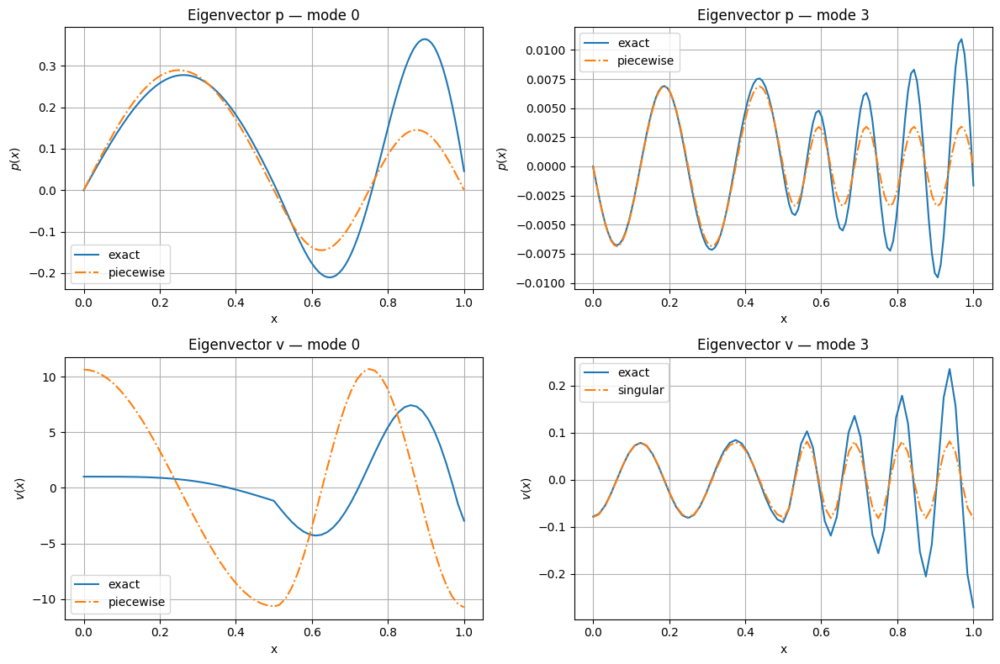

$[Closest] idx=0  \omega=(12.56591846352604-0.19702062459992079j)  \epsilon_r=(1.8319601377686685+0j)$
$[Closest] idx=26  \omega=(50.25723288504177-0.1950984746609522j)  \epsilon_r=(1.7097622103458088+0j)$


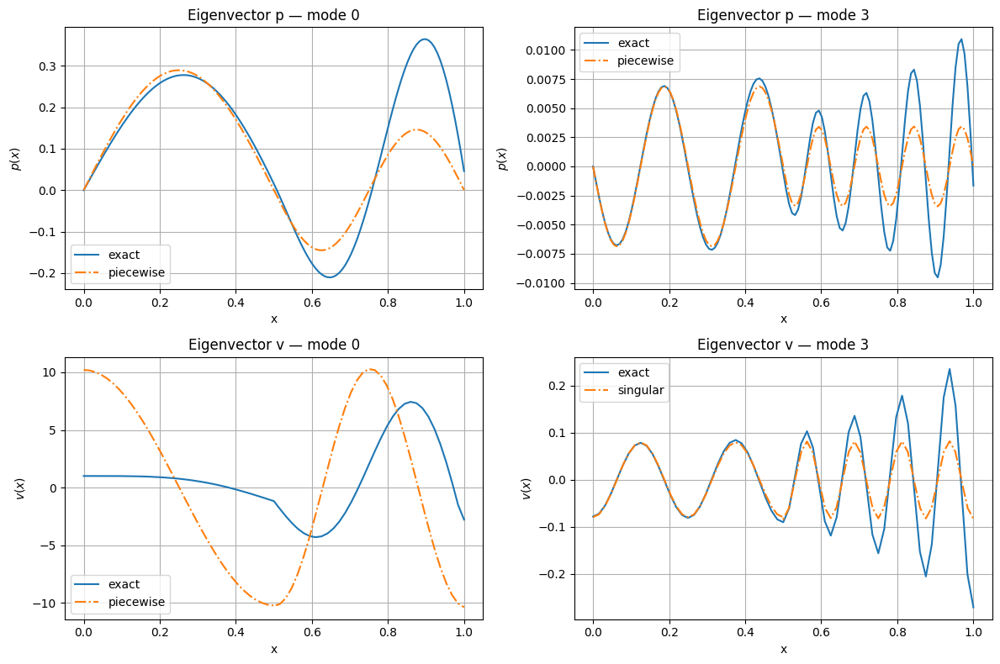

$[Closest] idx=0  \omega=(12.56581647234975-0.245499690861155j)  \epsilon_r=(1.7603886322419742+0j)$
$[Closest] idx=26  \omega=(50.256669478951416-0.24309752956219643j)  \epsilon_r=(1.6411502477446396+0j)$


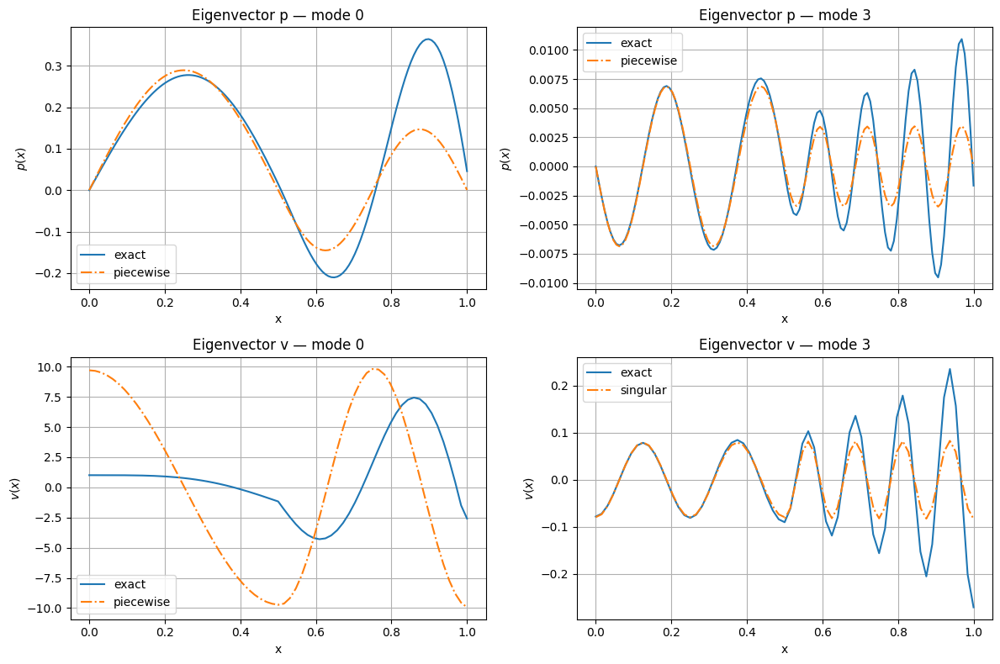

$[Closest] idx=0  \omega=(12.565691588293348-0.2938883877758695j)  \epsilon_r=(1.6912958779975615+0j)$
$[Closest] idx=26  \omega=(50.25597952813679-0.2910024160273039j)  \epsilon_r=(1.5750619741602387+0j)$


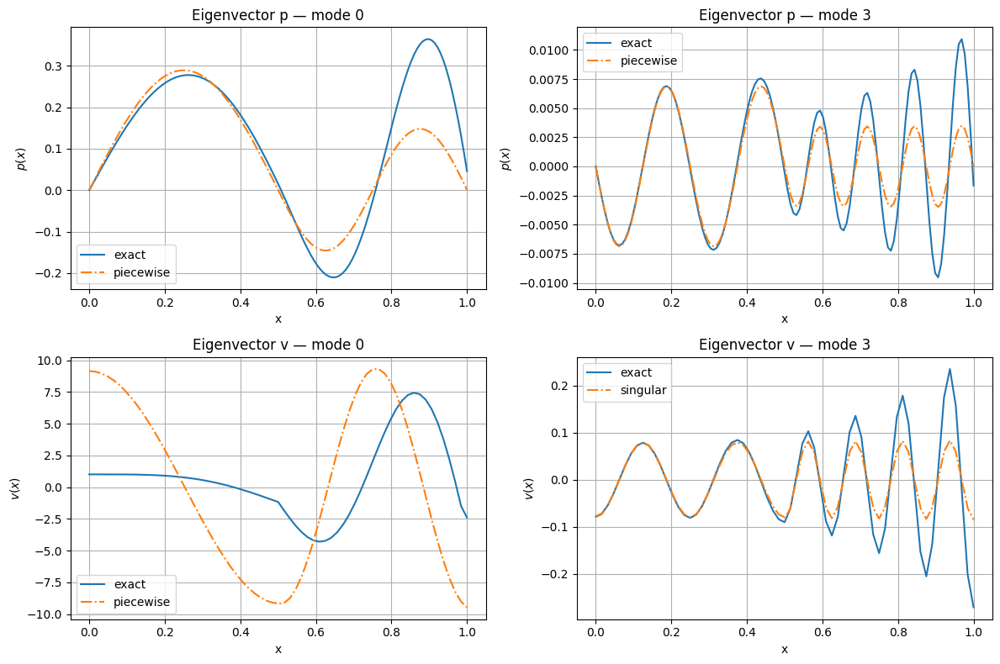

$[Closest] idx=0  \omega=(12.565543518964997-0.34216835460074124j)  \epsilon_r=(1.6245744041364945+0j)$
$[Closest] idx=26  \omega=(50.255161367511406-0.3387939876693974j)  \epsilon_r=(1.5113804740123766+0j)$


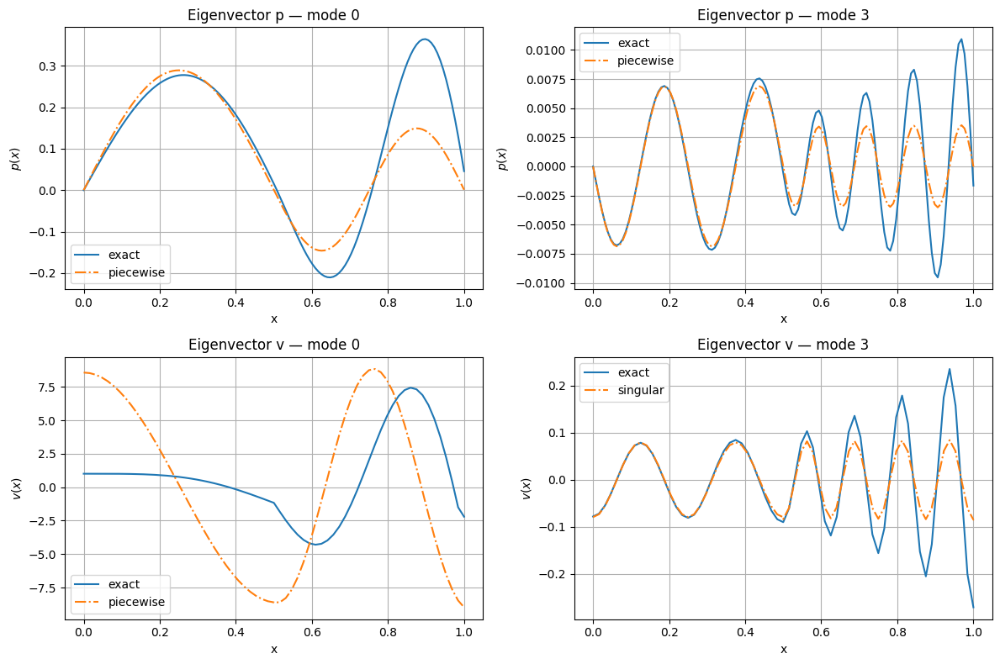

$[Closest] idx=0  \omega=(12.56537191817482-0.39032097250339653j)  \epsilon_r=(1.5601214088510198+0j)$
$[Closest] idx=26  \omega=(50.254213025246365-0.38645282087491456j)  \epsilon_r=(1.449995359231386+0j)$


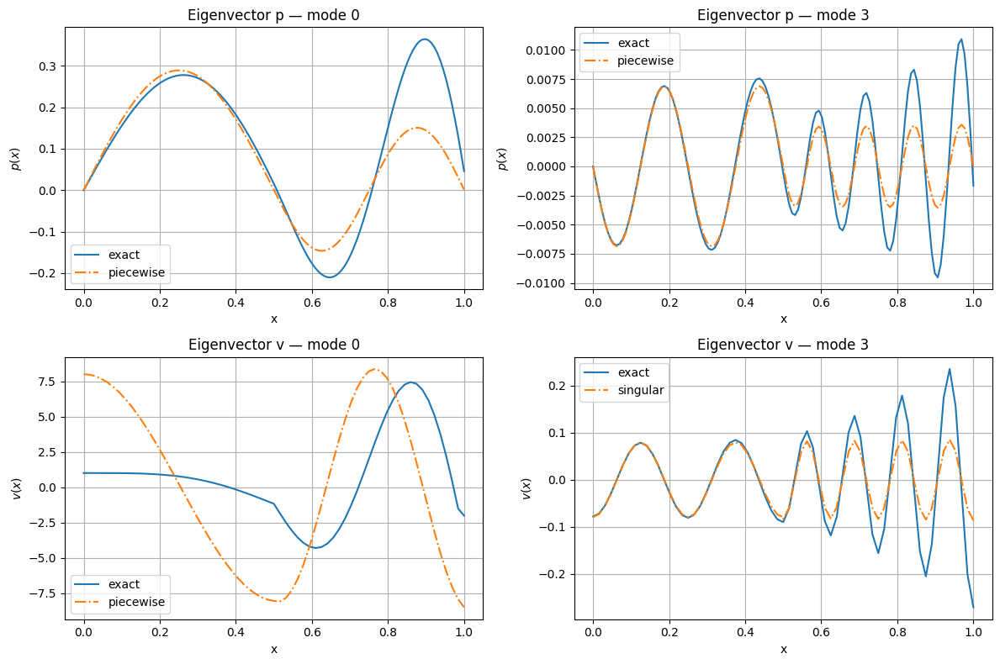

$[Closest] idx=0  \omega=(12.565176385449066-0.4383273208545782j)  \epsilon_r=(1.4978388555066064+0j)$
$[Closest] idx=26  \omega=(50.25313221984098-0.4339591671525101j)  \epsilon_r=(1.3908025507462782+0j)$


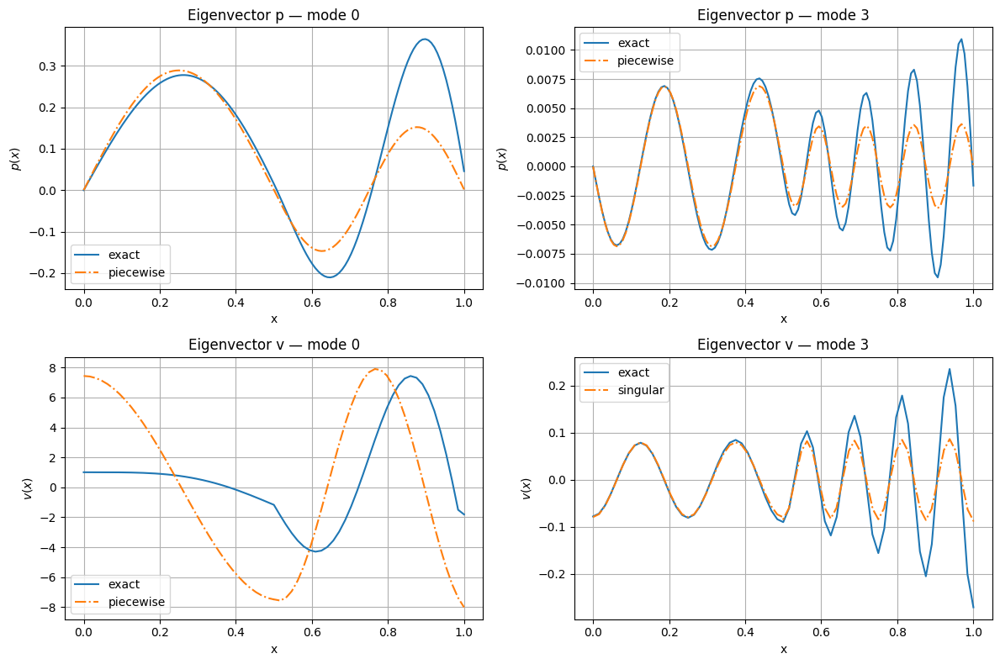

$[Closest] idx=0  \omega=(12.56495646553524-0.4861681331103138j)  \epsilon_r=(1.4376335147127988+0j)$
$[Closest] idx=26  \omega=(50.251916357127755-0.48129290467867863j)  \epsilon_r=(1.3337040627754022+0j)$


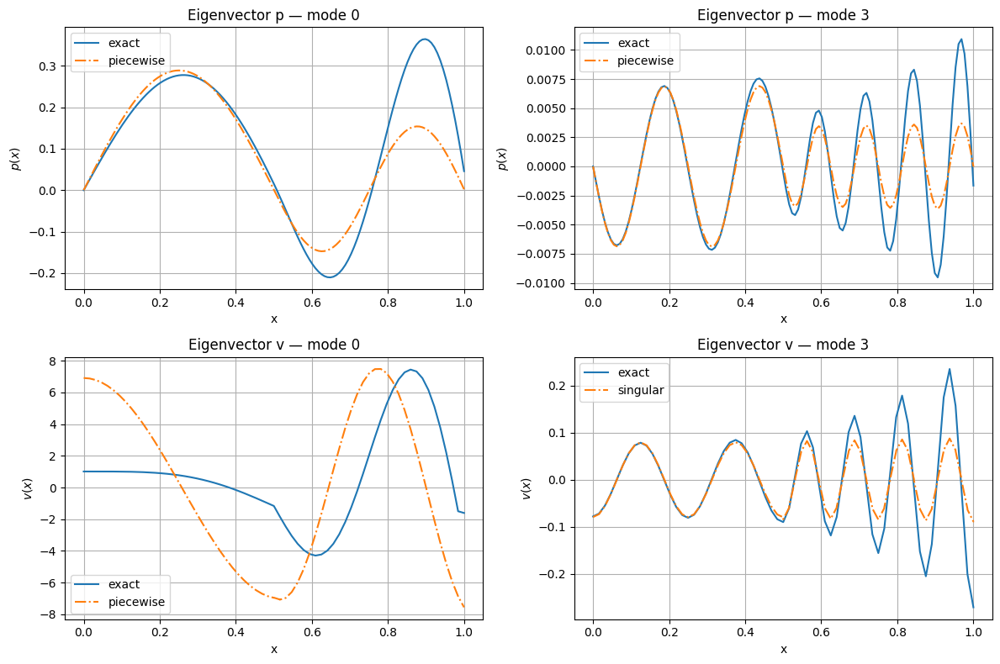

$[Closest] idx=0  \omega=(12.564711647929867-0.5338237522856646j)  \epsilon_r=(1.3794169622639592+0j)$
$[Closest] idx=26  \omega=(50.250562527410764-0.5284334889631039j)  \epsilon_r=(1.2786077912355247+0j)$


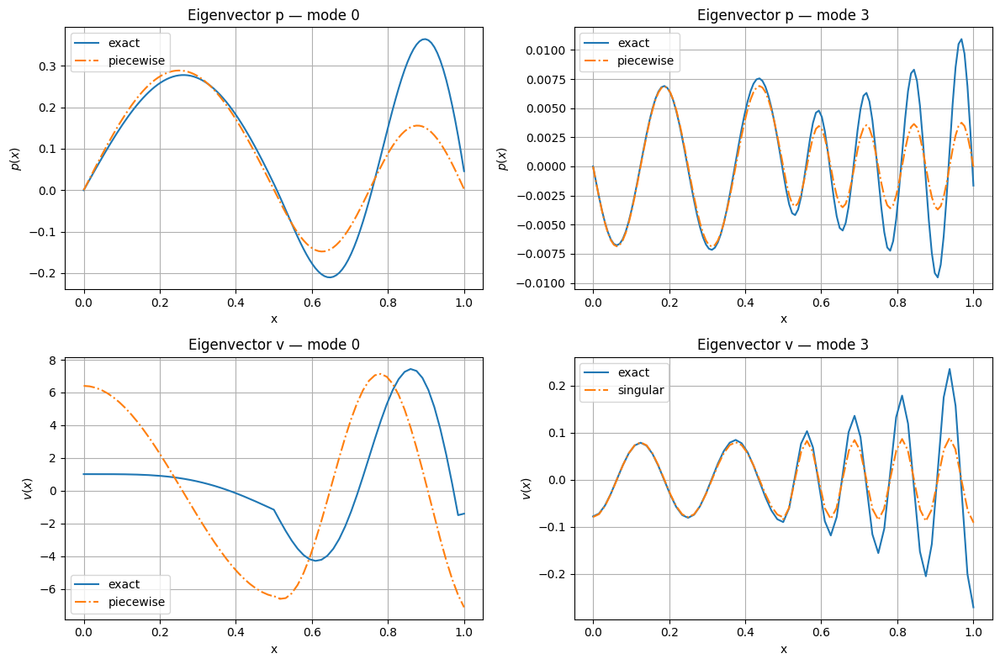

$[Closest] idx=0  \omega=(12.564441366466978-0.5812740860496259j)  \epsilon_r=(1.3231055413568595+0j)$
$[Closest] idx=26  \omega=(50.24906750296278-0.575359902569525j)  \epsilon_r=(1.2254273074776543+0j)$


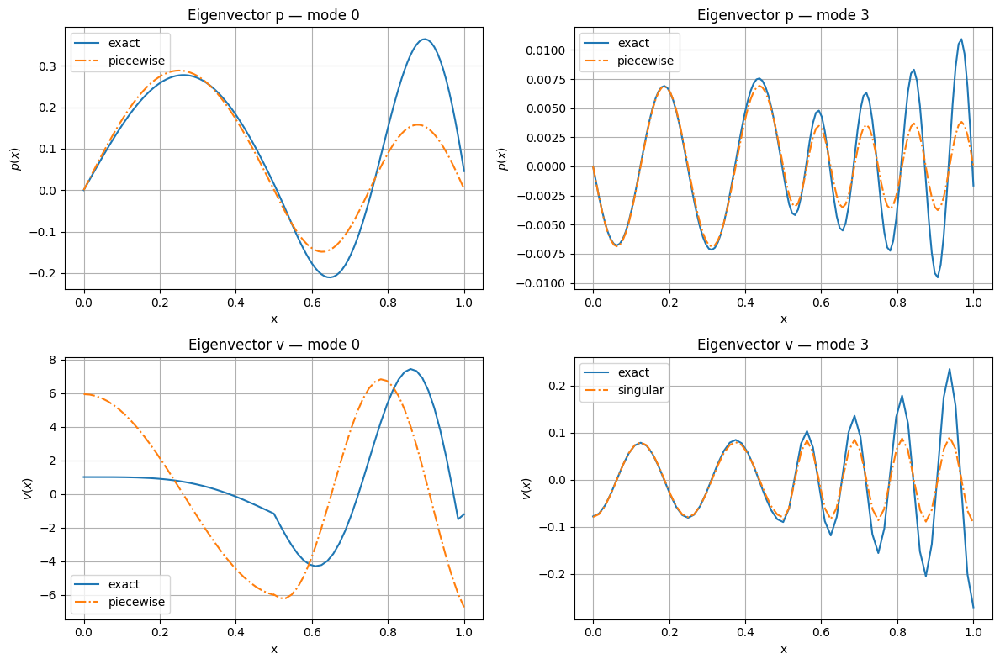

$[Closest] idx=0  \omega=(12.564144999016797-0.628498561505357j)  \epsilon_r=(1.2686202962071658+0j)$
$[Closest] idx=26  \omega=(50.2474277361804-0.6220506038564385j)  \epsilon_r=(1.1740816584803064+0j)$


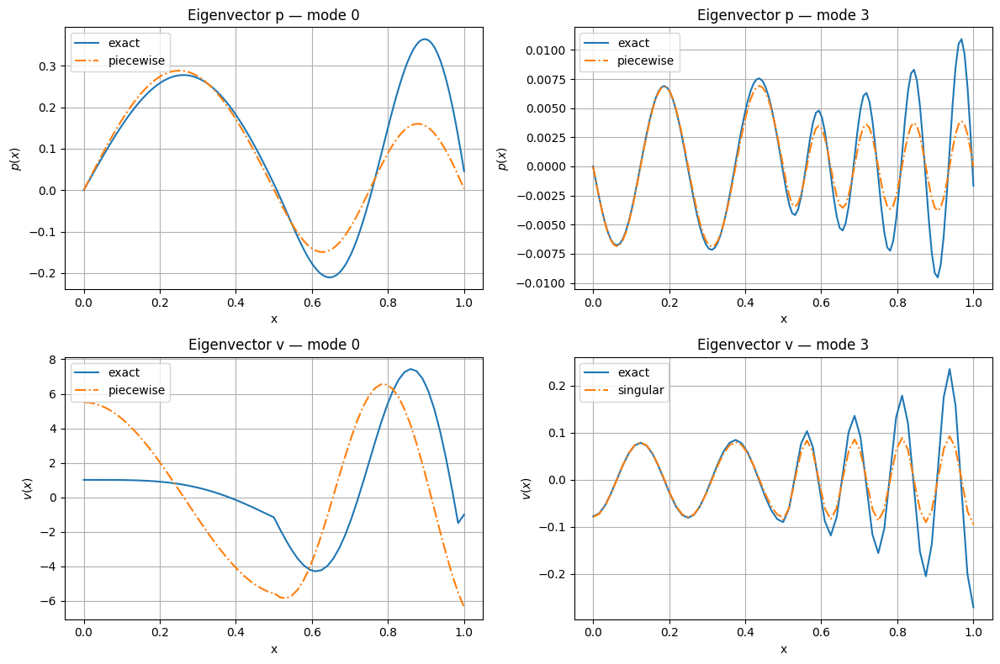

$[Closest] idx=0  \omega=(12.563821867349937-0.6754760797604185j)  \epsilon_r=(1.2158868830731941+0j)$
$[Closest] idx=26  \omega=(50.245639358737705-0.6684834747237394j)  \epsilon_r=(1.124495174568298+0j)$


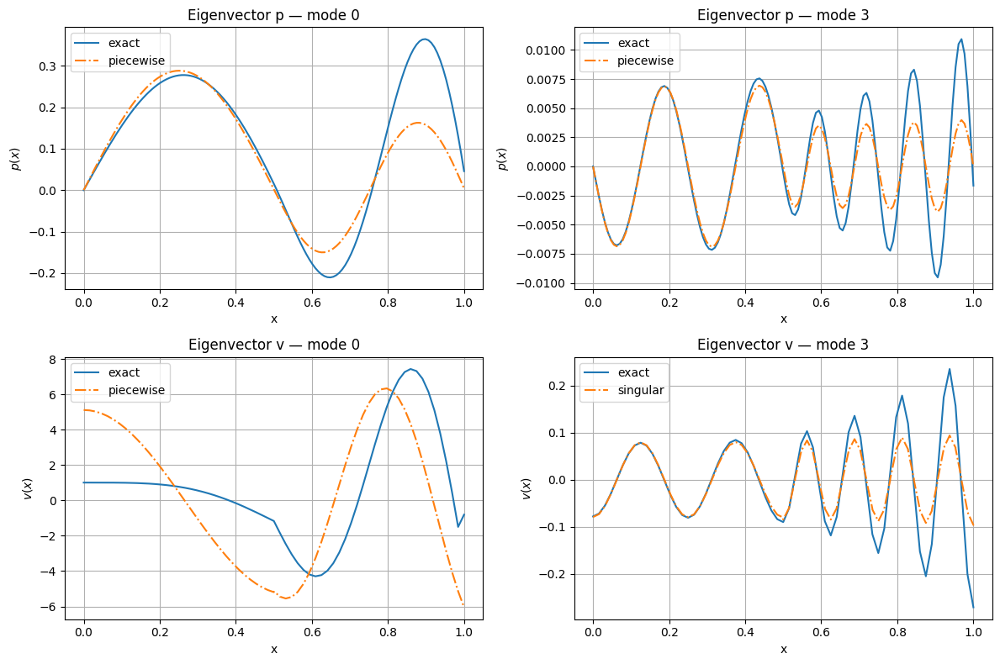

$[Closest] idx=0  \omega=(12.563471237237012-0.722184970442596j)  \epsilon_r=(1.1648354637286547+0j)$
$[Closest] idx=26  \omega=(50.24369818215881-0.7146357673924926j)  \epsilon_r=(1.0765972856791772+0j)$


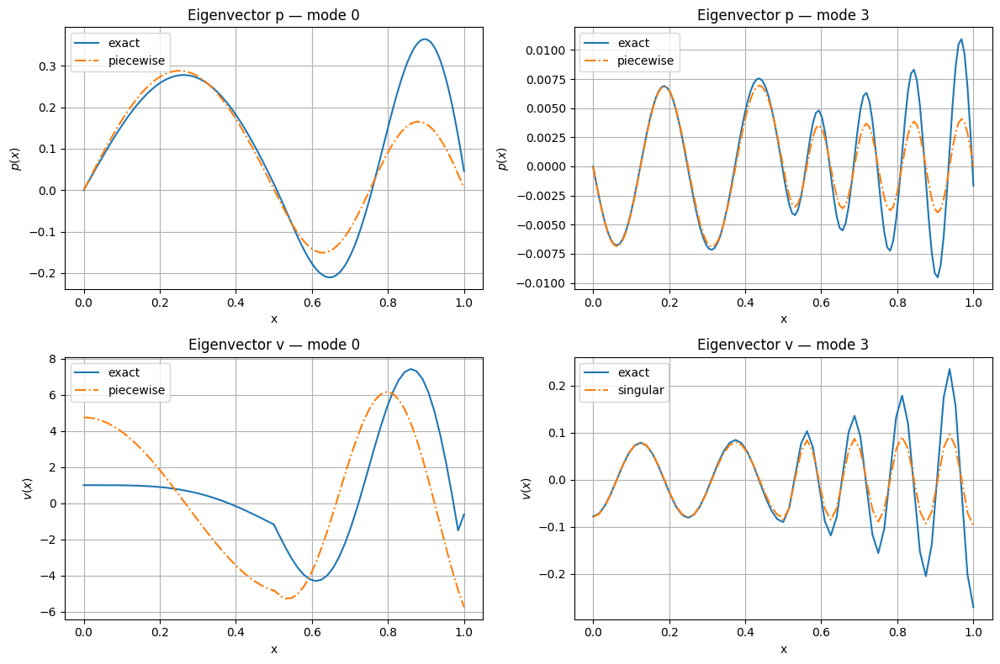

$[Closest] idx=0  \omega=(12.563092318864845-0.7686029463750107j)  \epsilon_r=(1.1154005855929165+0j)$
$[Closest] idx=26  \omega=(50.24159970031845-0.7604840502854147j)  \epsilon_r=(1.0303223471690361+0j)$


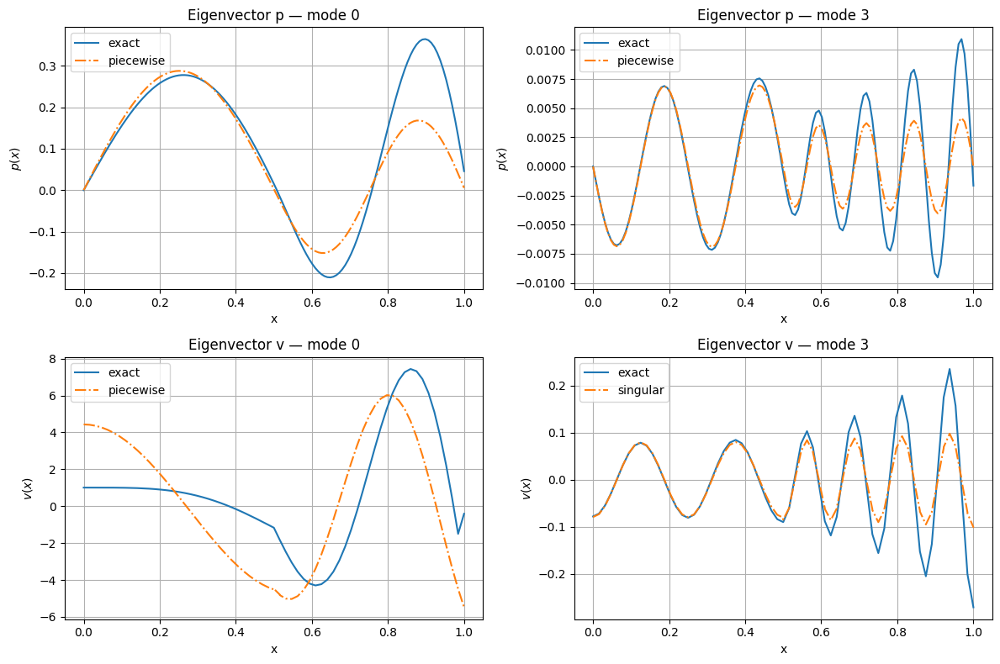

$[Closest] idx=0  \omega=(12.562684267667274-0.8147070586969793j)  \epsilon_r=(1.0675210520022849+0j)$
$[Closest] idx=26  \omega=(50.239339094465215-0.8060041531345952j)  \epsilon_r=(0.9856094761241208+0j)$


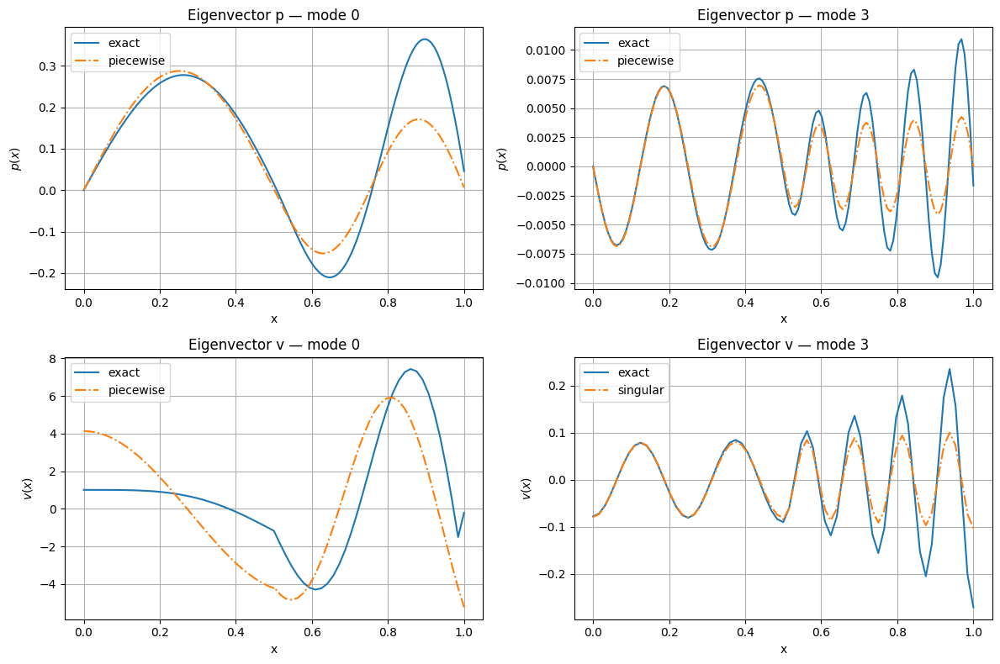

$[Closest] idx=0  \omega=(12.56224618568462-0.8604736527998875j)  \epsilon_r=(1.0211397854803959+0j)$
$[Closest] idx=26  \omega=(50.23691124148959-0.8511711115103314j)  \epsilon_r=(0.9424023991310866+0j)$


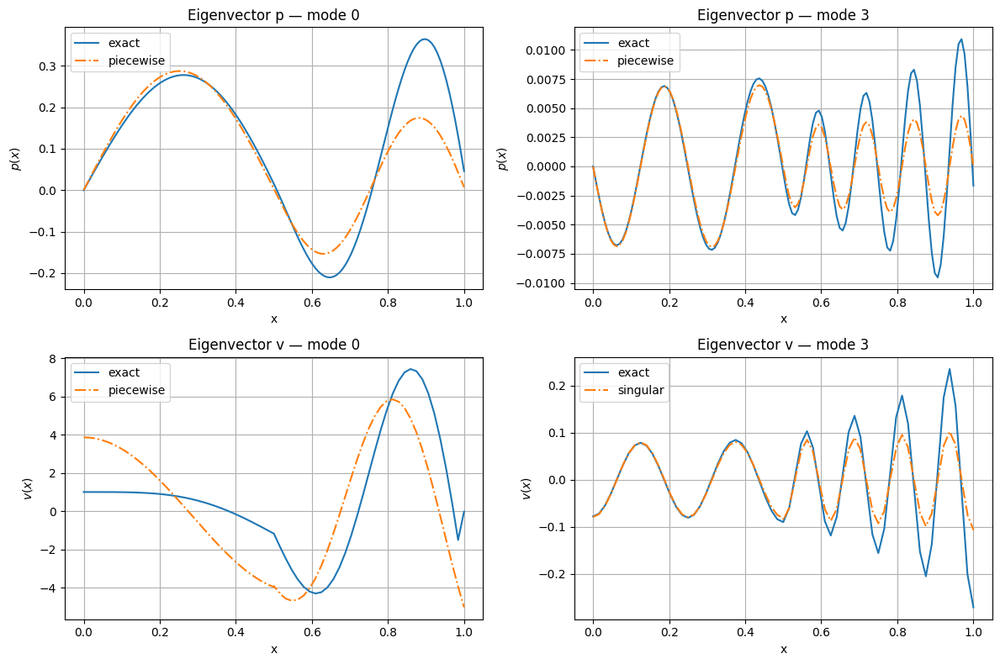

$[Closest] idx=0  \omega=(12.561777123586468-0.9058783255459334j)  \epsilon_r=(0.9762036863196375+0j)$
$[Closest] idx=26  \omega=(50.23431072627299-0.8959591110543492j)  \epsilon_r=(0.9006493124414501+0j)$


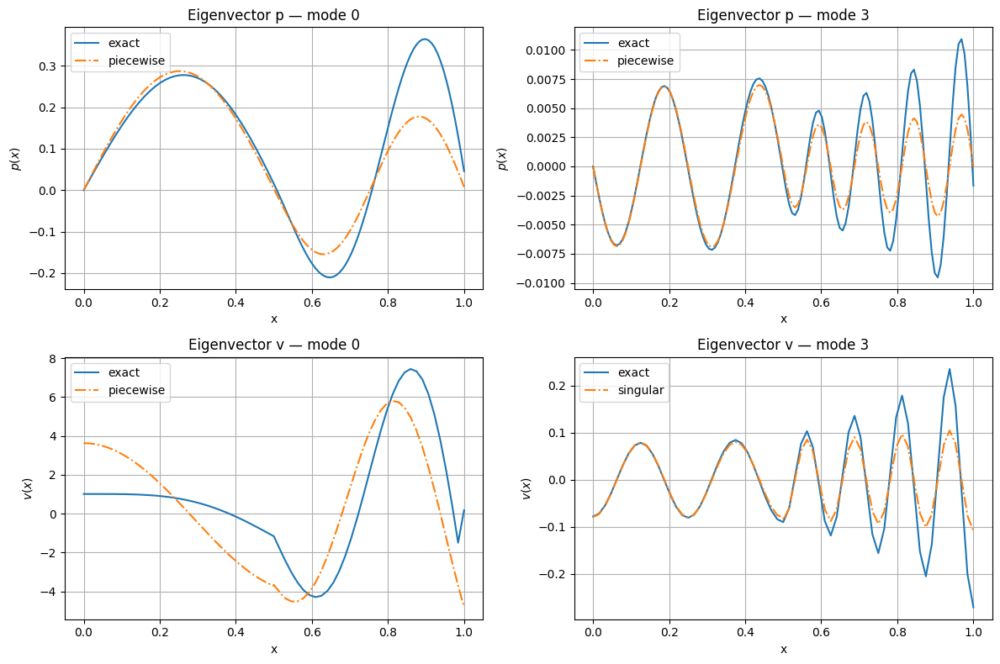

$[Closest] idx=0  \omega=(12.561276083514409-0.9508958843553308j)  \epsilon_r=(0.9326634883049552+0j)$
$[Closest] idx=26  \omega=(50.23153185912322-0.9403414318060623j)  \epsilon_r=(0.8603027554451611+0j)$


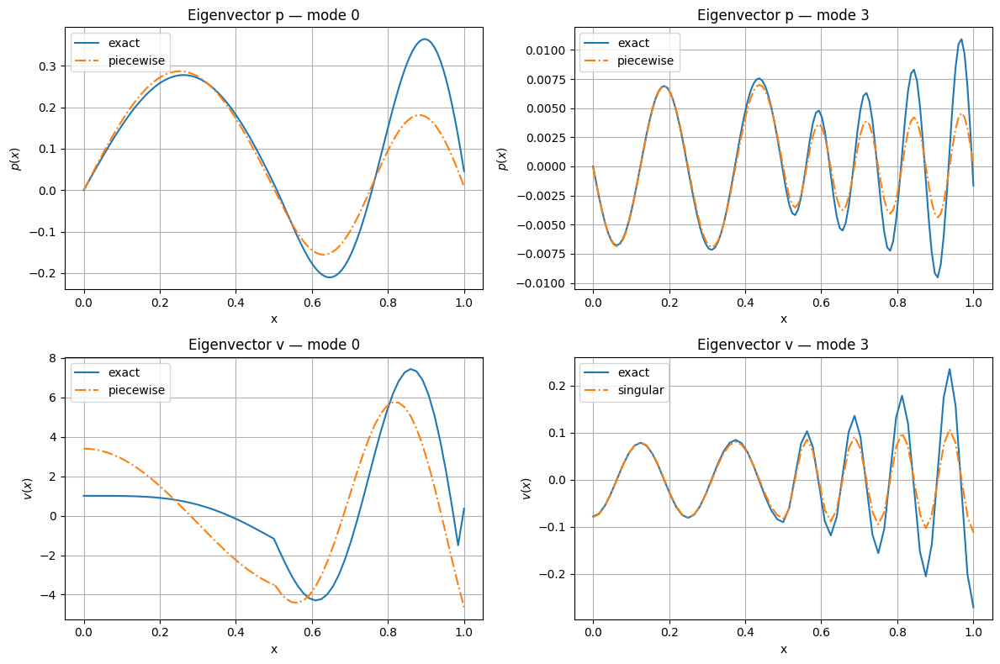

$[Closest] idx=0  \omega=(12.560742022925883-0.9955003088799094j)  \epsilon_r=(0.89047361299109+0j)$
$[Closest] idx=26  \omega=(50.22856869943674-0.984290393145261j)  \epsilon_r=(0.8213194983305553+0j)$


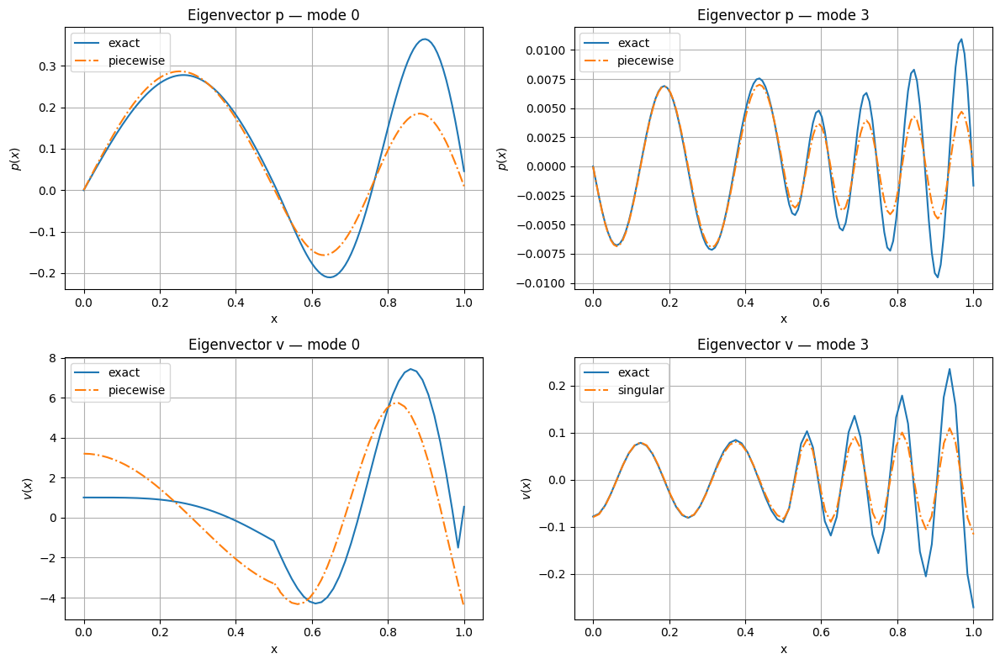

$[Closest] idx=0  \omega=(12.560173859647044-1.0396647161381938j)  \epsilon_r=(0.8495920235651631+0j)$
$[Closest] idx=26  \omega=(50.22541508695397-1.0277773000434474j)  \epsilon_r=(0.7836604447423594+0j)$


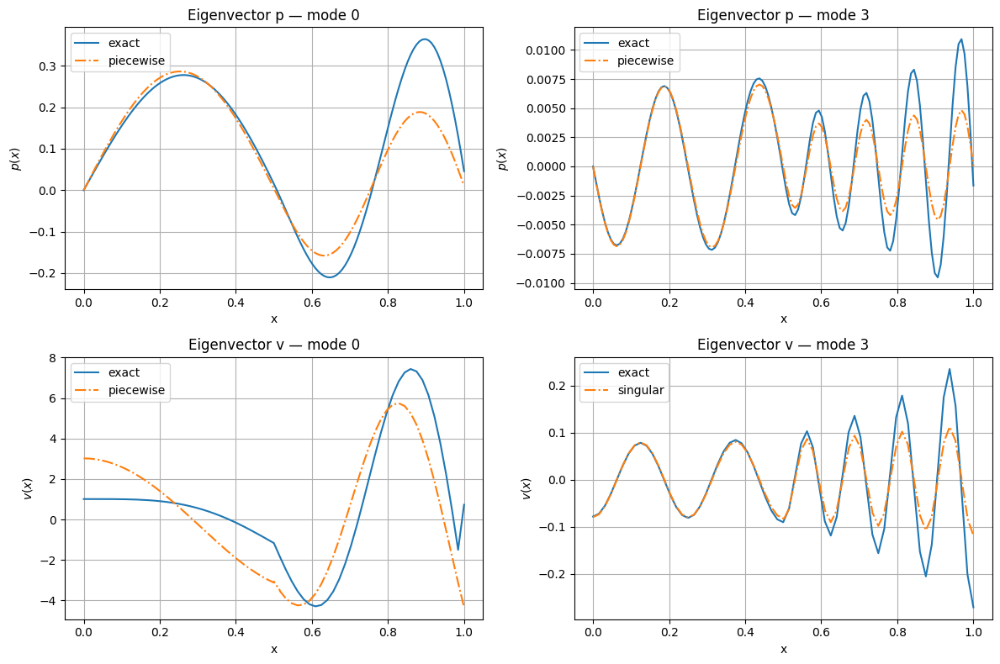

$[Closest] idx=0  \omega=(12.559570478371233-1.083361330163982j)  \epsilon_r=(0.8099800789874867+0j)$
$[Closest] idx=26  \omega=(50.222064682135475-1.0707723915134528j)  \epsilon_r=(0.7472905501318701+0j)$


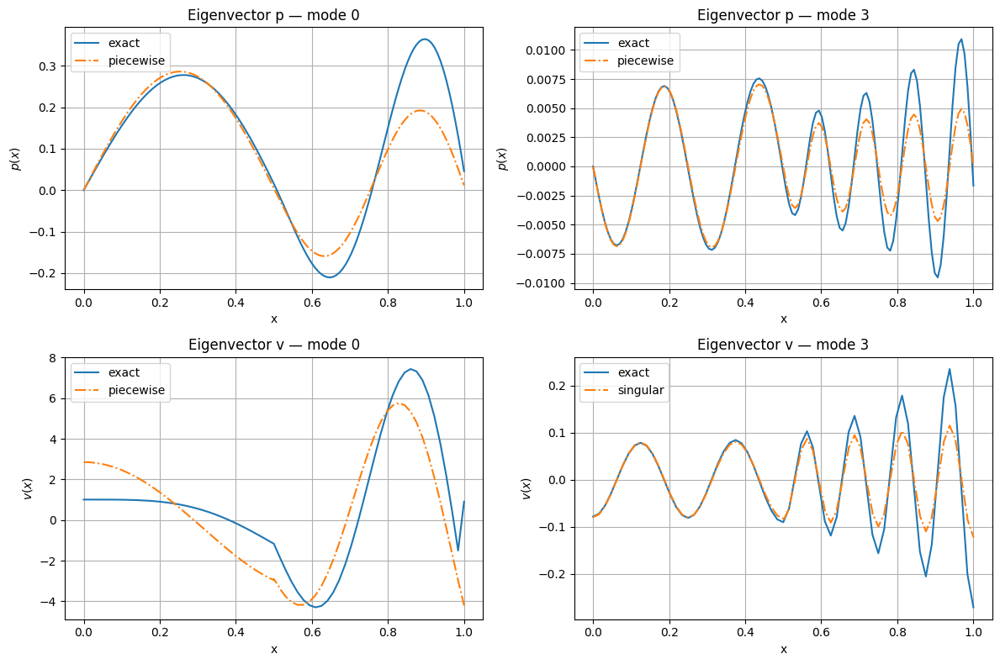

$[Closest] idx=0  \omega=(12.558930738868533-1.1265614574225795j)  \epsilon_r=(0.7716023887918284+0j)$
$[Closest] idx=26  \omega=(50.218511017434324-1.1132447924050086j)  \epsilon_r=(0.7121787563018773+0j)$


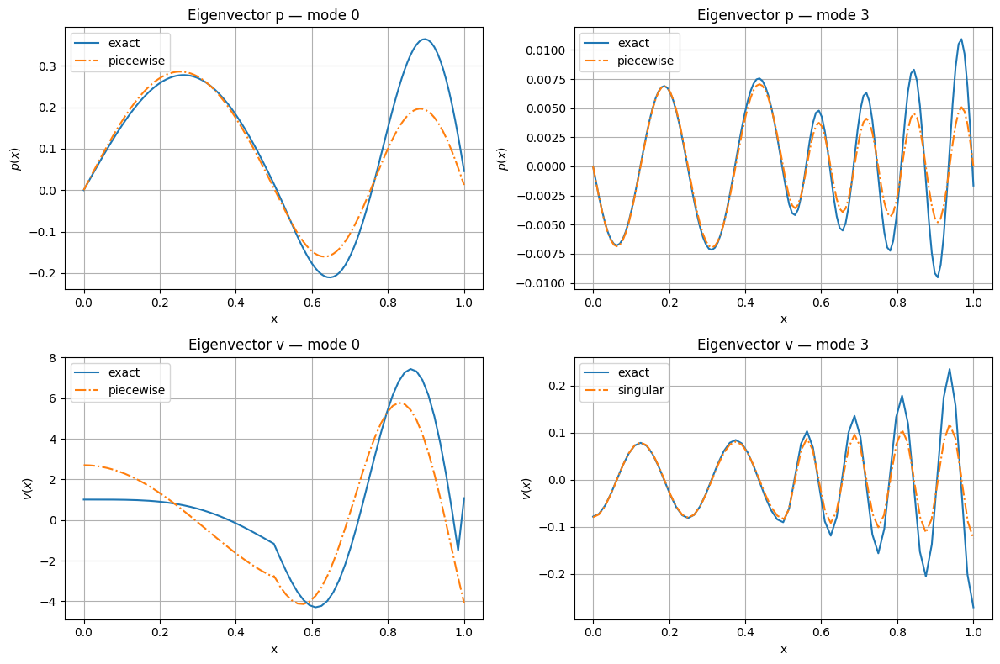

$[Closest] idx=0  \omega=(12.55825348620164-1.1692354694744926j)  \epsilon_r=(0.734426668639539+0j)$
$[Closest] idx=26  \omega=(50.21474756144449-1.1551624699963978j)  \epsilon_r=(0.6782979423388785+0j)$


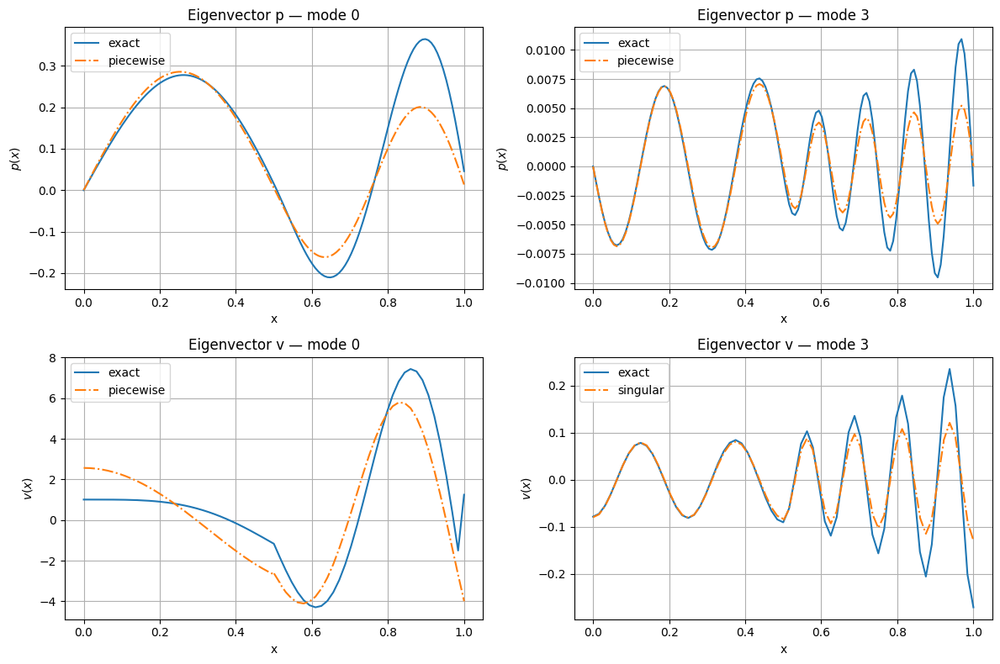

$[Closest] idx=0  \omega=(12.557537563271007-1.211352794616359j)  \epsilon_r=(0.6984235964524131+0j)$
$[Closest] idx=26  \omega=(50.21076779813824-1.1964921972055007j)  \epsilon_r=(0.6456248916477376+0j)$


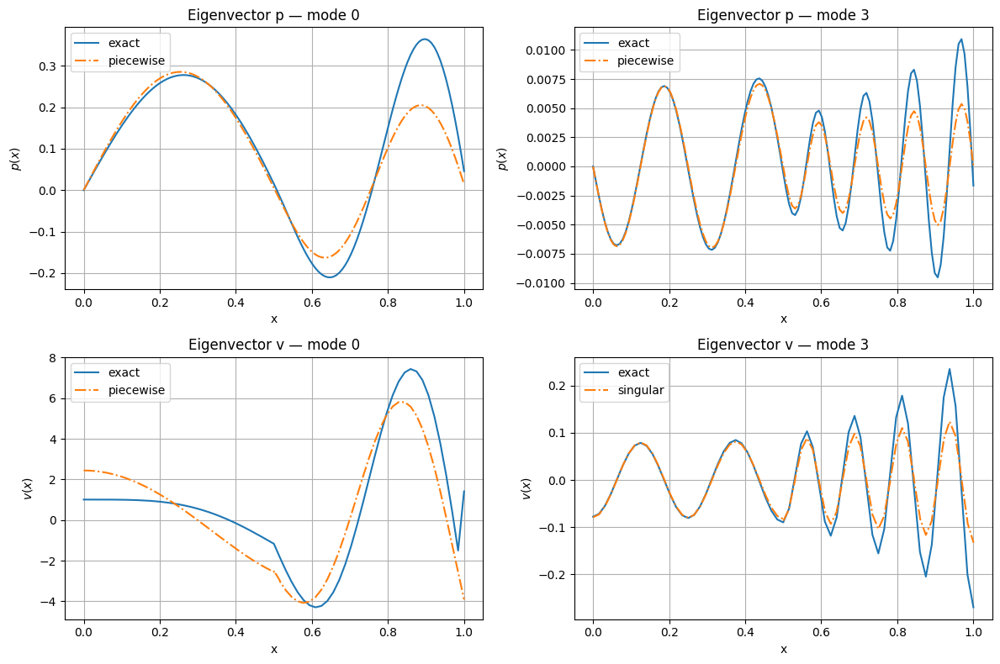

$[Closest] idx=0  \omega=(12.556781826034811-1.252881920500898j)  \epsilon_r=(0.6635666686955022+0j)$
$[Closest] idx=26  \omega=(50.2065653236021-1.2371995246974477j)  \epsilon_r=(0.6141402740839657+0j)$


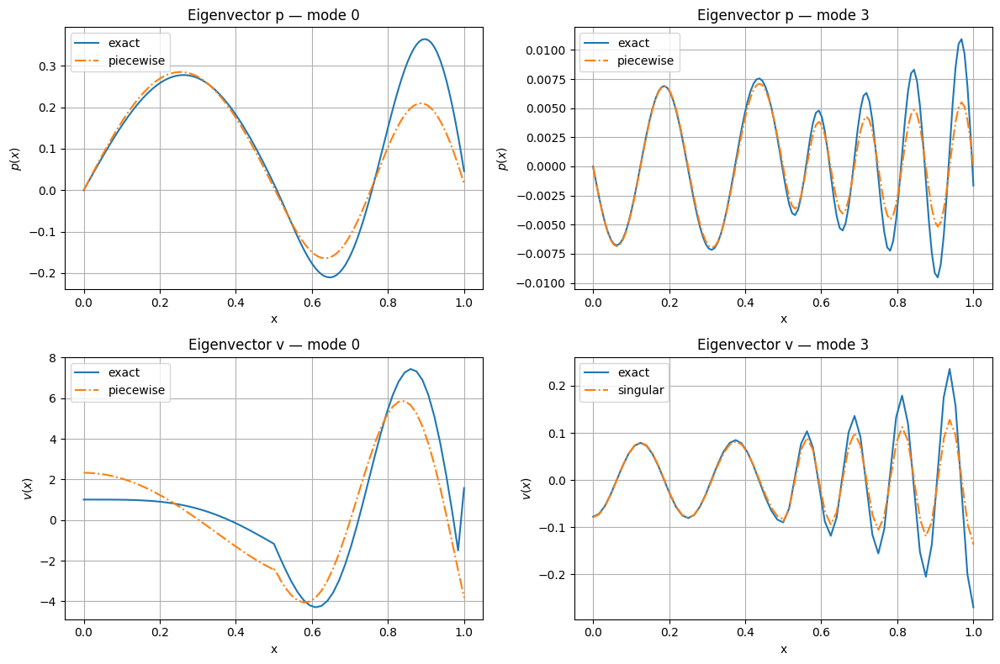

In [ ]:
# Diccionarios onde gardar os erros para cada refinamento N
rel_err_sigma_sweep = {0: {}, 3: {}}   # erros para modo 0 e 3
approx_omega  = {0: {}, 3: {}}
approx_p      = {0: {}, 3: {}}
approx_v      = {0: {}, 3: {}}

# Iterar sobre N = 0,1,2 → corresponde a h_i[0], h_i[1], h_i[2]
for N, h in enumerate(h_i):

    print(f"\n=== Executando para N = {N+2}, h = {h} ===")

    # Inicializar listas baleiras para este N
    rel_err_sigma_sweep[0][N] = []
    rel_err_sigma_sweep[3][N] = []

    approx_omega[0][N] = []
    approx_omega[3][N] = []

    approx_p[0][N] = []
    approx_p[3][N] = []

    approx_v[0][N] = []
    approx_v[3][N] = []

    # Crear nova malla para este refinamento
    mesh = create_interval(
        MPI.COMM_WORLD,
        int((Lx + pml_thickness) / h),
        [0, Lx + pml_thickness]
    )

    # Percorrer sigma_sweep_piecewise
    for i, sigma_i in enumerate(sigma_sweep_piecewise):

        sigma_piecewise_ufl=lambda x: conditional(x[0] > Lx, sigma_i, 0.0)
        solver_piecewise, mesh, Q_, V_, dof_ = get_configured_problem(mesh, degree, sigma_piecewise_ufl)
        (eig0, p0, v0, err0, eig3, p3, v3, err3) = get_closest_approx_eigenpair(solver_piecewise, Q_, V_, dof_, sigma_i, mesh,verbose=True, plot=True)

        # Gardar resultados
        approx_omega[0][N].append(eig0)
        approx_omega[3][N].append(eig3)

        approx_p[0][N].append(p0)
        approx_p[3][N].append(p3)

        approx_v[0][N].append(v0)
        approx_v[3][N].append(v3)

        rel_err_sigma_sweep[0][N].append(err0)
        rel_err_sigma_sweep[3][N].append(err3)


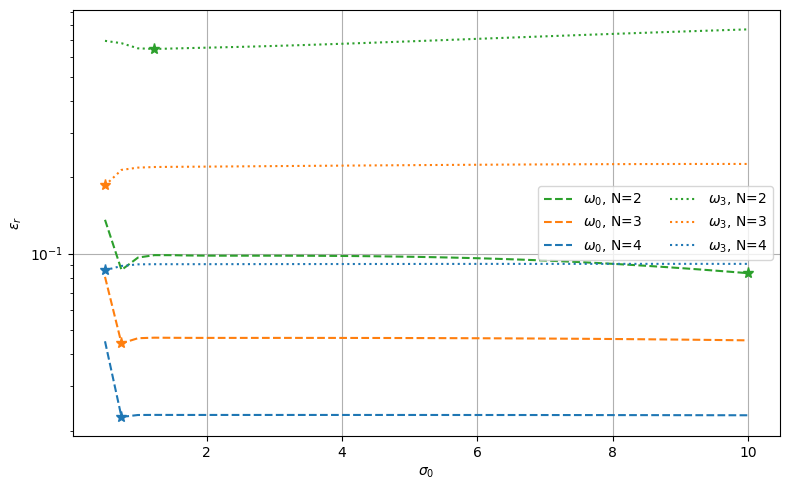

In [ ]:
import matplotlib.pyplot as plt

colors = ['tab:green', 'tab:orange', 'tab:blue']  
linestyles = {0: '--', 3: ':'}
labels = {0: r'$\omega_0$', 3: r'$\omega_3$'}

plt.figure(figsize=(8,5))

# ITERAR SOBRE OS INDICES REAIS: 0,1,2
for j in [0,3]:  # modos físicos
    for N_index in range(len(h_i)):   # N_index = 0,1,2
        plot_N = N_index + 2          # para etiquetas: 2,3,4
        col = colors[N_index]

        errs = rel_err_sigma_sweep[j][N_index]
        ls = linestyles[j]

        # curva
        plt.plot(
            sigma_sweep_piecewise,
            errs,
            color=col,
            linestyle=ls,
            label=f"{labels[j]}, N={plot_N}"
        )

        # mínimo
        k = np.argmin(errs)
        plt.plot(
            sigma_sweep_piecewise[k],
            errs[k],
            '*',
            color=col,
            markersize=8
        )

plt.xlabel(r'$\sigma_0$')
plt.ylabel(r'$\epsilon_r$')
plt.grid(True)
plt.yscale('log')
plt.legend(ncol=2)
plt.tight_layout()
plt.show()
